In [5]:
import sys
sys.path.append("../..")
import func.load_database13 as db
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from grn_tpm import text_bn_graph
from pathlib import Path
import itertools
import contextlib
import io

In [10]:
# 生成图的函数
def create_digraph_from_bn(file_path):
    F, I, degree, variables, constants = db.text_to_BN(folder="", textfile=str(file_path))
    G = nx.DiGraph()
    all_nodes = variables + constants
    G.add_nodes_from(all_nodes)
    for i in range(len(variables)):
        for j in I[i]:
            G.add_edges_from([(all_nodes[j], variables[i])])
    return G

In [9]:
# 寻找3元完全子图函数
def find_complete_subgraphs(G, k=3):
    node_combinations = list(itertools.combinations(G.nodes(), k))
    complete_subgraphs = []
    for nodes in node_combinations:
        subgraph = G.subgraph(nodes)
        #if nx.is_complete(subgraph):
        if all(G.has_edge(u, v) or G.has_edge(v, u) for u, v in itertools.permutations(nodes, 2)):
            complete_subgraphs.append(nodes)
    return complete_subgraphs


In [11]:
# 去除包含环境的三元组
def filter_triples(complete_triples, name_to_index):
    # 使用列表推导式过滤三元组
    filtered_triples = [
        triple for triple in complete_triples
        if all(name in name_to_index for name in triple)
    ]
    return filtered_triples

In [25]:
def cal_motify(file_path):
    # 文件-图
    graph = create_digraph_from_bn(file_path)
    # 找出三元完全子图
    complete_triples = find_complete_subgraphs(graph, 3)
    # 将文件的节点名称与序号对应
    with open(file_path, 'r') as file:
        lines = file.readlines()
    name_to_index = {}
    for index, line in enumerate(lines):
        line = line.strip()
        equal_sign_index = line.find('=')
        if equal_sign_index != -1:
            content = line[:equal_sign_index].strip()
            name_to_index[content] = index
    # 排除包含环境的三元组
    filter_complete_triples = filter_triples(complete_triples, name_to_index)
    # 将找到的三元组名称换成序号
    replaced_triples = [(name_to_index[n1], name_to_index[n2], name_to_index[n3]) for n1, n2, n3 in filter_complete_triples]
    # 存储结果
    un = {}
    un_en = {}
    syn = {}
    # 计算un,un_en,syn值
    for triple,name_triples in zip(replaced_triples,complete_triples):
        un[name_triples],un_en[name_triples],syn[name_triples],_,_,_,_,_ =\
        text_bn_graph(textfile=str(file_path), candidate_sys=list(triple), fill_onenode=True, noise=0, save_onenote=False)
    # 绘制一维散点图
    x_values = range(len(un))
    y_un = [un[key] for key in un]
    y_un_en = [un_en[key] for key in un]
    y_syn = [syn[key] for key in un]
    plt.figure(figsize=(10, 6)) 
    plt.scatter(x_values, y_un, label=f"{str(file_path)[15:25]}_un", marker='o')
    plt.scatter(x_values, y_un_en, label=f"{str(file_path)[15:25]}_un_en", marker='o')
    plt.scatter(x_values, y_syn, label=f"{str(file_path)[15:25]}_syn", marker='o')
    plt.legend()
    plt.title(str(file_path)[15:-4])
    plt.xlabel('Complete Triples')
    plt.ylabel('Values')
    plt.savefig(f"{str(file_path)[15:-4]}_one.png")
    plt.show()
    # 绘制un和un_en二维散点图
    x_un = [un[key] for key in un]
    y_un_en = [un_en[key] for key in un]
    plt.figure(figsize=(10, 6)) 
    plt.scatter(x_un, y_un, marker='o')
    plt.title(str(file_path)[15:-4])
    plt.xlabel('un')
    plt.ylabel('un_en')
    plt.savefig(f"{str(file_path)[15:-4]}_two.png")
    plt.show()
    # 绘制三维散点图
    x_un = [un[key] for key in un]
    y_un_en = [un_en[key] for key in un_en]
    z_syn = [syn[key] for key in syn]
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(x_un, y_un_en, z_syn, marker='o')
    ax.set_xlabel('UN')
    ax.set_ylabel('UN_EN')
    ax.set_zlabel('SYN')
    ax.set_title(f"3D Scatter Plot for {str(file_path)[15:-4]}")
    plt.savefig(f"{str(file_path)[15:-4]}_3D.png")
    plt.show()

In [13]:
file_dict = {}
directory = Path('cellcollective')
counter = 0
for file_path in directory.rglob('*'):
    if file_path.is_file():
        file_dict[counter] = str(file_path)
        counter += 1
file_dict

{0: 'cellcollective\\Apoptosis Network_19422837.txt',
 1: 'cellcollective\\Arabidopsis thaliana Cell Cycle_26340681.txt',
 2: 'cellcollective\\Aurora Kinase A in Neuroblastoma_26616283.txt',
 3: 'cellcollective\\B bronchiseptica and T retortaeformis coinfection_22253585.txt',
 4: 'cellcollective\\B cell differentiation_26751566.txt',
 5: 'cellcollective\\Body Segmentation in Drosophila 2013_23520449.txt',
 6: 'cellcollective\\Bordetella bronchiseptica_22253585.txt',
 7: 'cellcollective\\Bortezomib Responses in U266 Human Myeloma Cells_26163548.txt',
 8: 'cellcollective\\BT474 Breast Cell Line Long-term ErbB Network_24970389.txt',
 9: 'cellcollective\\BT474 Breast Cell Line Short-term ErbB Network_24970389.txt',
 10: 'cellcollective\\Budding Yeast Cell Cycle 2009_19185585.txt',
 11: 'cellcollective\\Budding Yeast Cell Cycle_23049686.txt',
 12: 'cellcollective\\Cardiac development_23056457.txt',
 13: 'cellcollective\\CD4 T cell signaling_25538703.txt',
 14: 'cellcollective\\CD4+ T Cell D

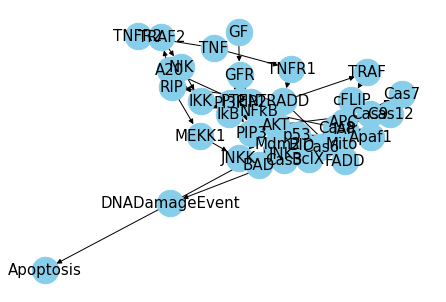

all intrinsic variables: MEKK1,NFkB,Mdm2,p53,IAP,FADD,BID,Cas3,RIP,BclX,JNK,TNFR1,PI3K,Cas6,APC,TRADD,Mito,TRAF2,IkB,DNADamageEvent,NIK,Apoptosis,Cas12,GFR,Cas9,PTEN,Cas7,PIP2,A20,Apaf1,PIP3,TNFR2,cFLIP,AKT,TRAF,JNKK,BAD,Cas8,IKK
external parameters:GF,TNF
mechanism:    p53,BID,BclX
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]
environment:    p53,BID,BclX,Mdm2,JNK,DNADamageEvent,Cas8,NFkB,BAD
un:  0.5939170247634329
un_en:  1.352537449944031
syn:  0.20617692024482992
------------------------------------------------------------------------------------------------------------------------


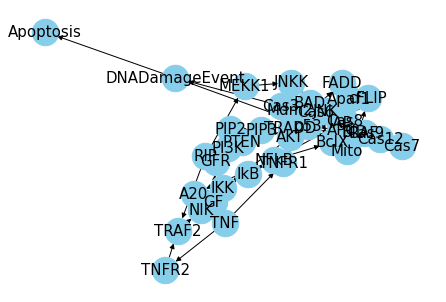

all intrinsic variables: MEKK1,NFkB,Mdm2,p53,IAP,FADD,BID,Cas3,RIP,BclX,JNK,TNFR1,PI3K,Cas6,APC,TRADD,Mito,TRAF2,IkB,DNADamageEvent,NIK,Apoptosis,Cas12,GFR,Cas9,PTEN,Cas7,PIP2,A20,Apaf1,PIP3,TNFR2,cFLIP,AKT,TRAF,JNKK,BAD,Cas8,IKK
external parameters:GF,TNF
mechanism:    p53,BID,JNK
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]]
environment:    p53,BID,JNK,Mdm2,DNADamageEvent,BclX,Cas8,JNKK
un:  0.2909671312947577
un_en:  1.96606107630302
syn:  0.39239751704132964
------------------------------------------------------------------------------------------------------------------------


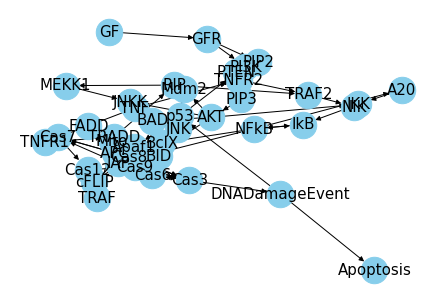

all intrinsic variables: MEKK1,NFkB,Mdm2,p53,IAP,FADD,BID,Cas3,RIP,BclX,JNK,TNFR1,PI3K,Cas6,APC,TRADD,Mito,TRAF2,IkB,DNADamageEvent,NIK,Apoptosis,Cas12,GFR,Cas9,PTEN,Cas7,PIP2,A20,Apaf1,PIP3,TNFR2,cFLIP,AKT,TRAF,JNKK,BAD,Cas8,IKK
external parameters:GF,TNF
mechanism:    p53,BclX,BAD
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]
environment:    p53,BclX,BAD,Mdm2,JNK,DNADamageEvent,NFkB,AKT
un:  0.5487949406953986
un_en:  1.4254094125055803
syn:  0.27902459041938454
------------------------------------------------------------------------------------------------------------------------


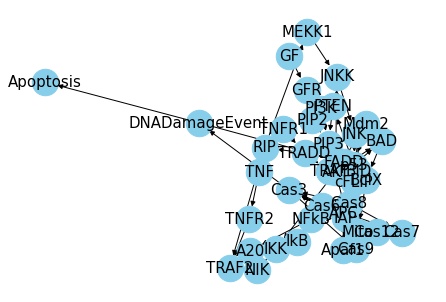

all intrinsic variables: MEKK1,NFkB,Mdm2,p53,IAP,FADD,BID,Cas3,RIP,BclX,JNK,TNFR1,PI3K,Cas6,APC,TRADD,Mito,TRAF2,IkB,DNADamageEvent,NIK,Apoptosis,Cas12,GFR,Cas9,PTEN,Cas7,PIP2,A20,Apaf1,PIP3,TNFR2,cFLIP,AKT,TRAF,JNKK,BAD,Cas8,IKK
external parameters:GF,TNF
mechanism:    IAP,Cas3,Cas6
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]
environment:    IAP,Cas3,Cas6,NFkB,Mito,APC,Cas8
un:  1.4732778860006897
un_en:  0.6212246349113915
syn:  0.19005348954774148
------------------------------------------------------------------------------------------------------------------------


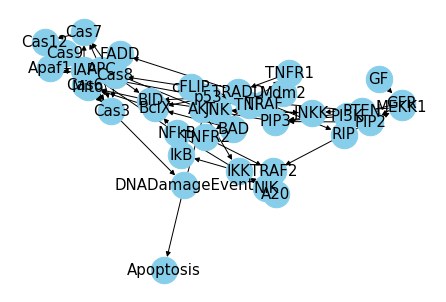

all intrinsic variables: MEKK1,NFkB,Mdm2,p53,IAP,FADD,BID,Cas3,RIP,BclX,JNK,TNFR1,PI3K,Cas6,APC,TRADD,Mito,TRAF2,IkB,DNADamageEvent,NIK,Apoptosis,Cas12,GFR,Cas9,PTEN,Cas7,PIP2,A20,Apaf1,PIP3,TNFR2,cFLIP,AKT,TRAF,JNKK,BAD,Cas8,IKK
external parameters:GF,TNF
mechanism:    IAP,Cas3,APC
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]
environment:    IAP,Cas3,APC,NFkB,Cas6,Mito,Cas8,Cas9,Apaf1
un:  0.835008777038192
un_en:  0.863320787969086
syn:  0.2643333126872436
------------------------------------------------------------------------------------------------------------------------


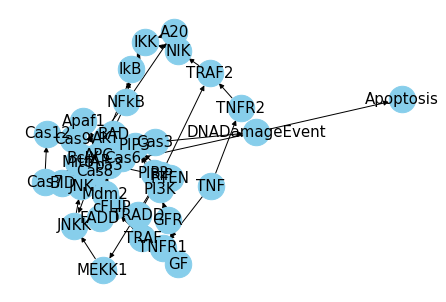

all intrinsic variables: MEKK1,NFkB,Mdm2,p53,IAP,FADD,BID,Cas3,RIP,BclX,JNK,TNFR1,PI3K,Cas6,APC,TRADD,Mito,TRAF2,IkB,DNADamageEvent,NIK,Apoptosis,Cas12,GFR,Cas9,PTEN,Cas7,PIP2,A20,Apaf1,PIP3,TNFR2,cFLIP,AKT,TRAF,JNKK,BAD,Cas8,IKK
external parameters:GF,TNF
mechanism:    IAP,Cas3,Cas9
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]
environment:    IAP,Cas3,Cas9,NFkB,Cas6,Mito,APC,Cas8,Cas12,AKT
un:  0.8427281256292154
un_en:  1.0913182198973352
syn:  0.3076243157601326
------------------------------------------------------------------------------------------------------------------------


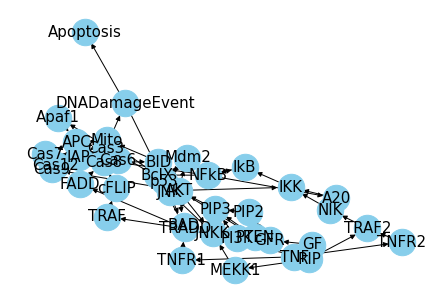

all intrinsic variables: MEKK1,NFkB,Mdm2,p53,IAP,FADD,BID,Cas3,RIP,BclX,JNK,TNFR1,PI3K,Cas6,APC,TRADD,Mito,TRAF2,IkB,DNADamageEvent,NIK,Apoptosis,Cas12,GFR,Cas9,PTEN,Cas7,PIP2,A20,Apaf1,PIP3,TNFR2,cFLIP,AKT,TRAF,JNKK,BAD,Cas8,IKK
external parameters:GF,TNF
mechanism:    IAP,APC,Mito
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]
environment:    IAP,APC,Mito,NFkB,Cas3,Cas6,Cas9,Apaf1,BID,BclX
un:  0.33406112299665036
un_en:  1.27673857308631
syn:  0.2145760839500892
------------------------------------------------------------------------------------------------------------------------


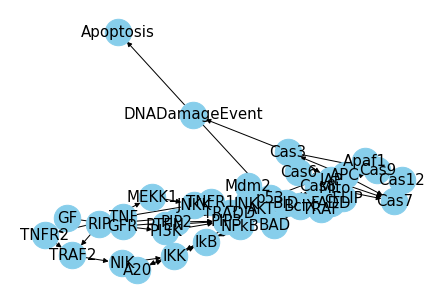

all intrinsic variables: MEKK1,NFkB,Mdm2,p53,IAP,FADD,BID,Cas3,RIP,BclX,JNK,TNFR1,PI3K,Cas6,APC,TRADD,Mito,TRAF2,IkB,DNADamageEvent,NIK,Apoptosis,Cas12,GFR,Cas9,PTEN,Cas7,PIP2,A20,Apaf1,PIP3,TNFR2,cFLIP,AKT,TRAF,JNKK,BAD,Cas8,IKK
external parameters:GF,TNF
mechanism:    IAP,APC,Cas9
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]
environment:    IAP,APC,Cas9,NFkB,Cas3,Cas6,Mito,Apaf1,Cas12,AKT
un:  0.3472095254319034
un_en:  1.1522328142908043
syn:  0.20142768151483637
------------------------------------------------------------------------------------------------------------------------


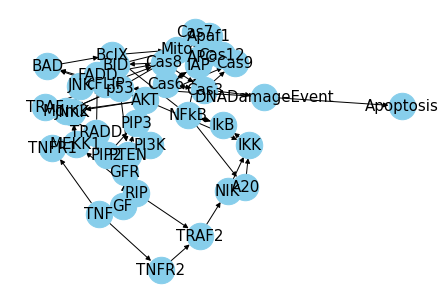

all intrinsic variables: MEKK1,NFkB,Mdm2,p53,IAP,FADD,BID,Cas3,RIP,BclX,JNK,TNFR1,PI3K,Cas6,APC,TRADD,Mito,TRAF2,IkB,DNADamageEvent,NIK,Apoptosis,Cas12,GFR,Cas9,PTEN,Cas7,PIP2,A20,Apaf1,PIP3,TNFR2,cFLIP,AKT,TRAF,JNKK,BAD,Cas8,IKK
external parameters:GF,TNF
mechanism:    IAP,APC,Cas7
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]
environment:    IAP,APC,Cas7,NFkB,Cas3,Cas6,Mito,Cas9,Apaf1,Cas8
un:  0.7421941914838
un_en:  0.9913462887463228
syn:  0.20648998796707163
------------------------------------------------------------------------------------------------------------------------


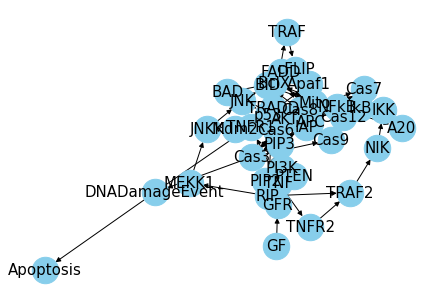

all intrinsic variables: MEKK1,NFkB,Mdm2,p53,IAP,FADD,BID,Cas3,RIP,BclX,JNK,TNFR1,PI3K,Cas6,APC,TRADD,Mito,TRAF2,IkB,DNADamageEvent,NIK,Apoptosis,Cas12,GFR,Cas9,PTEN,Cas7,PIP2,A20,Apaf1,PIP3,TNFR2,cFLIP,AKT,TRAF,JNKK,BAD,Cas8,IKK
external parameters:GF,TNF
mechanism:    BID,BclX,Mito
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]
environment:    BID,BclX,Mito,p53,JNK,Cas8,NFkB,BAD
un:  0.9840447306462928
un_en:  0.8890976555739161
syn:  0.08550409714066498
------------------------------------------------------------------------------------------------------------------------


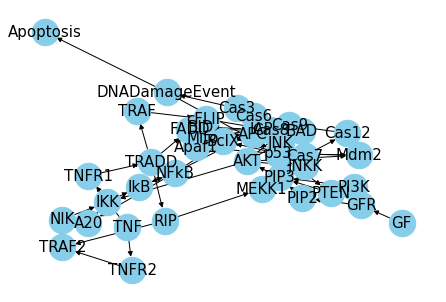

all intrinsic variables: MEKK1,NFkB,Mdm2,p53,IAP,FADD,BID,Cas3,RIP,BclX,JNK,TNFR1,PI3K,Cas6,APC,TRADD,Mito,TRAF2,IkB,DNADamageEvent,NIK,Apoptosis,Cas12,GFR,Cas9,PTEN,Cas7,PIP2,A20,Apaf1,PIP3,TNFR2,cFLIP,AKT,TRAF,JNKK,BAD,Cas8,IKK
external parameters:GF,TNF
mechanism:    Cas3,Cas6,Cas8
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]
environment:    Cas3,Cas6,Cas8,IAP,APC,FADD,cFLIP
un:  0.608092508843871
un_en:  1.6192766882947416
syn:  0.32527213949221634
------------------------------------------------------------------------------------------------------------------------


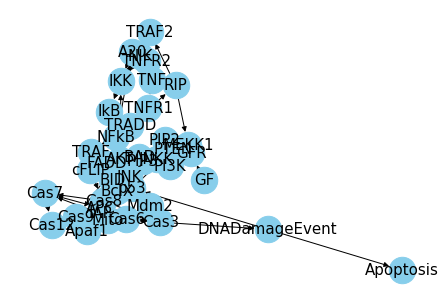

all intrinsic variables: MEKK1,NFkB,Mdm2,p53,IAP,FADD,BID,Cas3,RIP,BclX,JNK,TNFR1,PI3K,Cas6,APC,TRADD,Mito,TRAF2,IkB,DNADamageEvent,NIK,Apoptosis,Cas12,GFR,Cas9,PTEN,Cas7,PIP2,A20,Apaf1,PIP3,TNFR2,cFLIP,AKT,TRAF,JNKK,BAD,Cas8,IKK
external parameters:GF,TNF
mechanism:    Cas3,APC,Cas9
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]
environment:    Cas3,APC,Cas9,IAP,Cas6,Cas8,Mito,Apaf1,Cas12,AKT
un:  0.1284050575770375
un_en:  1.4625223959565563
syn:  0.2465949424229625
------------------------------------------------------------------------------------------------------------------------


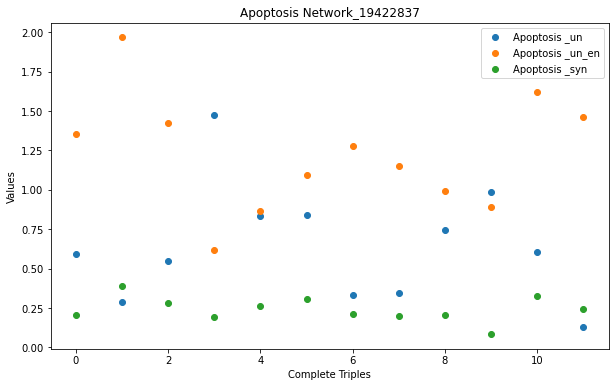

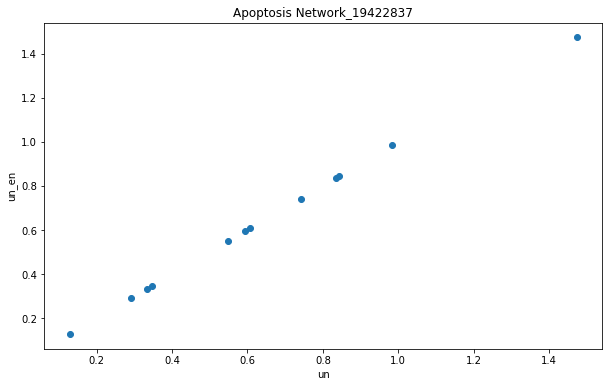

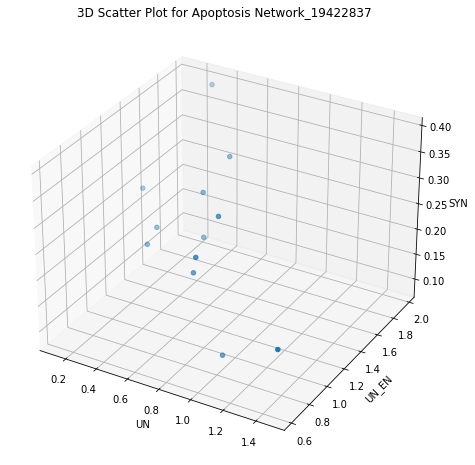

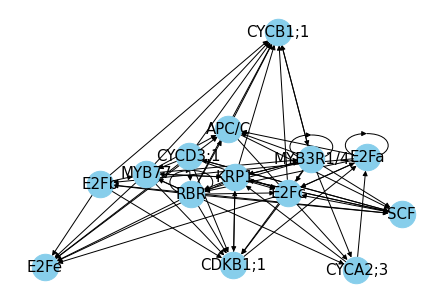

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB77,E2Fe,KRP1
tpm: 
[[0. 0. 1. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]]
environment:    MYB77,E2Fe,KRP1,E2Fb,RBR,CYCD3;1,E2Fc,MYB3R1/4,SCF,CDKB1;1,CYCA2;3
un:  0.7873606305272705
un_en:  1.5708545356578592
syn:  0.32359448416177905
------------------------------------------------------------------------------------------------------------------------


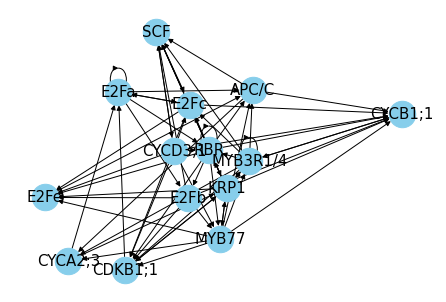

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB77,E2Fe,E2Fb
tpm: 
[[0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]]
environment:    MYB77,E2Fe,E2Fb,KRP1,RBR,CYCD3;1,E2Fc,E2Fa
un:  1.196003910866903
un_en:  1.172552174940276
syn:  0.27274608913309706
------------------------------------------------------------------------------------------------------------------------


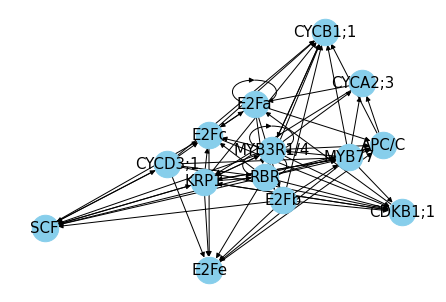

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB77,E2Fe,RBR
tpm: 
[[0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
environment:    MYB77,E2Fe,RBR,KRP1,E2Fb,CYCD3;1,E2Fc,MYB3R1/4,E2Fa
un:  0.926315417453555
un_en:  1.5219934766054037
syn:  0.41536690671448906
------------------------------------------------------------------------------------------------------------------------


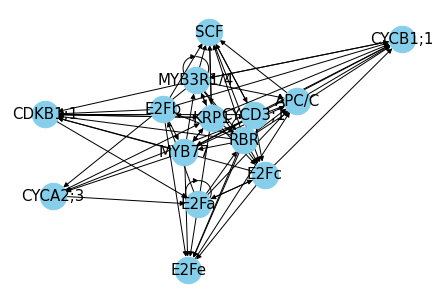

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB77,E2Fe,CYCD3;1
tpm: 
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]]
environment:    MYB77,E2Fe,CYCD3;1,KRP1,E2Fb,RBR,E2Fc,SCF
un:  0.7418798940897736
un_en:  1.843082339829277
syn:  0.2852347542463137
------------------------------------------------------------------------------------------------------------------------


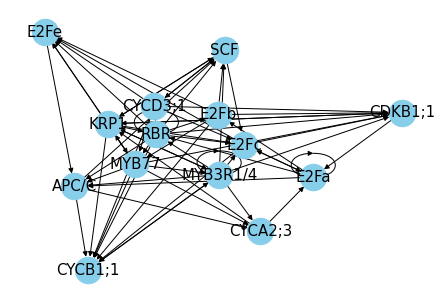

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB77,E2Fe,APC/C
tpm: 
[[0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]]
environment:    MYB77,E2Fe,APC/C,KRP1,E2Fb,RBR,CYCD3;1,E2Fc,MYB3R1/4,E2Fa
un:  1.424719134343745
un_en:  1.1493519803103363
syn:  0.24855388808761392
------------------------------------------------------------------------------------------------------------------------


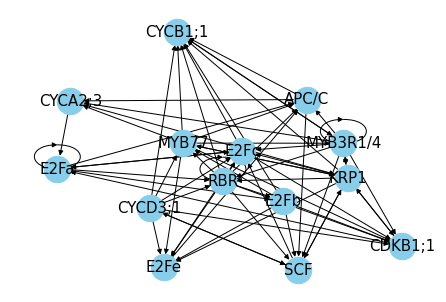

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB77,KRP1,MYB3R1/4
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]]
environment:    MYB77,KRP1,MYB3R1/4,E2Fb,RBR,CYCD3;1,SCF,CDKB1;1,CYCA2;3,CYCB1;1
un:  1.1921923538579082
un_en:  1.1443068857903906
syn:  0.27122251030135613
------------------------------------------------------------------------------------------------------------------------


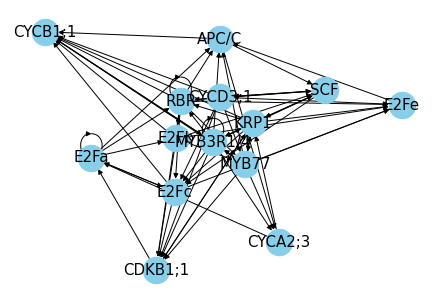

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB77,KRP1,CDKB1;1
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]]
environment:    MYB77,KRP1,CDKB1;1,E2Fb,RBR,CYCD3;1,MYB3R1/4,SCF,CYCA2;3,E2Fc
un:  0.3874579476807625
un_en:  1.3267167089133292
syn:  0.41159045318758
------------------------------------------------------------------------------------------------------------------------


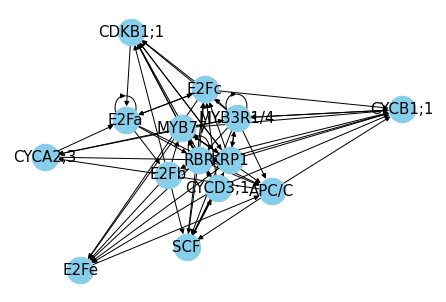

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB77,KRP1,RBR
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]]
environment:    MYB77,KRP1,RBR,E2Fb,CYCD3;1,MYB3R1/4,SCF,CDKB1;1,CYCA2;3,E2Fa
un:  0.5878993146277117
un_en:  1.5084413402140489
syn:  0.6697604509296803
------------------------------------------------------------------------------------------------------------------------


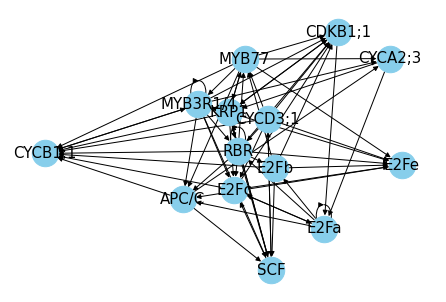

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB77,KRP1,CYCB1;1
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]
environment:    MYB77,KRP1,CYCB1;1,E2Fb,RBR,CYCD3;1,MYB3R1/4,SCF,CDKB1;1,CYCA2;3,E2Fc,APC/C
un:  0.21088012304601342
un_en:  2.1245224728827123
syn:  0.37798706445398655
------------------------------------------------------------------------------------------------------------------------


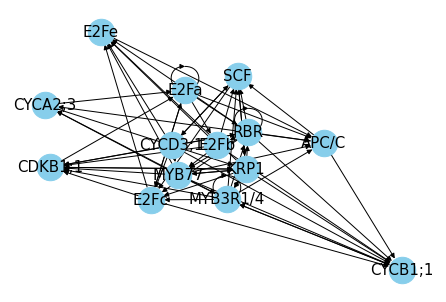

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB77,KRP1,CYCA2;3
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]
environment:    MYB77,KRP1,CYCA2;3,E2Fb,RBR,CYCD3;1,MYB3R1/4,SCF,CDKB1;1,APC/C
un:  0.31186666902472876
un_en:  1.9087264432824318
syn:  0.45758821375396713
------------------------------------------------------------------------------------------------------------------------


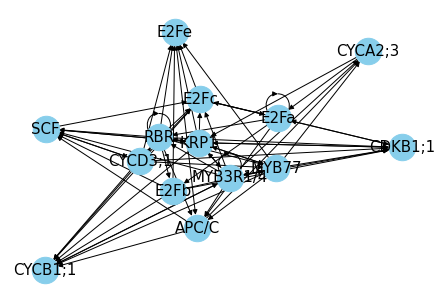

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB77,MYB3R1/4,CDKB1;1
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
environment:    MYB77,MYB3R1/4,CDKB1;1,KRP1,E2Fb,RBR,CYCD3;1,CYCB1;1,E2Fc
un:  1.1257574114345177
un_en:  1.028537798999877
syn:  0.14737461968026544
------------------------------------------------------------------------------------------------------------------------


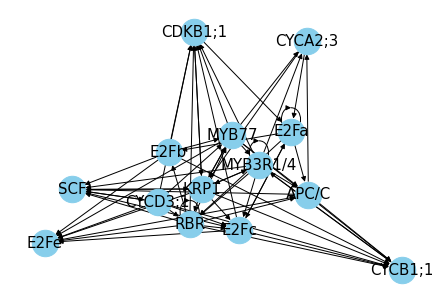

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB77,MYB3R1/4,RBR
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
environment:    MYB77,MYB3R1/4,RBR,KRP1,E2Fb,CYCD3;1,CYCB1;1,E2Fa
un:  1.3535513177764762
un_en:  0.958508660500713
syn:  0.5685092173190602
------------------------------------------------------------------------------------------------------------------------


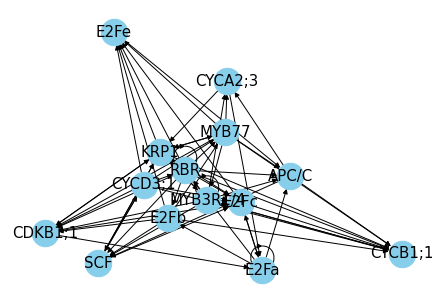

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB77,MYB3R1/4,CYCB1;1
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]]
environment:    MYB77,MYB3R1/4,CYCB1;1,KRP1,E2Fb,RBR,CYCD3;1,E2Fc,APC/C
un:  0.969125676452155
un_en:  1.645356924407667
syn:  0.18741464049494705
------------------------------------------------------------------------------------------------------------------------


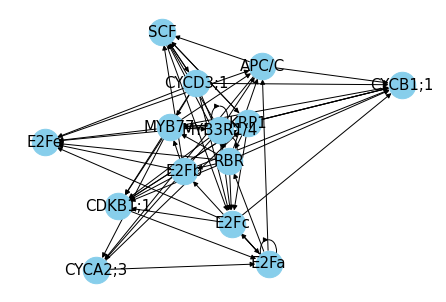

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB77,MYB3R1/4,CYCA2;3
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]]
environment:    MYB77,MYB3R1/4,CYCA2;3,KRP1,E2Fb,RBR,CYCD3;1,CYCB1;1,APC/C
un:  0.9271316922287571
un_en:  1.6345995797941164
syn:  0.213187838886026
------------------------------------------------------------------------------------------------------------------------


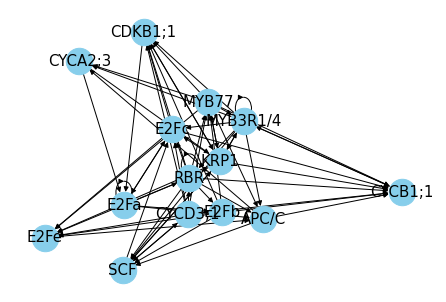

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB77,MYB3R1/4,APC/C
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]]
environment:    MYB77,MYB3R1/4,APC/C,KRP1,E2Fb,RBR,CYCD3;1,CYCB1;1,E2Fe,E2Fa
un:  0.8439668254437926
un_en:  1.7302488900493622
syn:  0.24947770567099092
------------------------------------------------------------------------------------------------------------------------


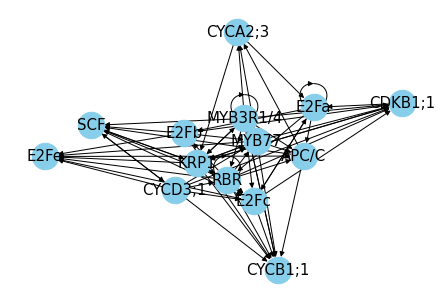

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB77,E2Fb,CDKB1;1
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]]
environment:    MYB77,E2Fb,CDKB1;1,KRP1,RBR,CYCD3;1,E2Fa,E2Fc,MYB3R1/4
un:  0.7405639854631378
un_en:  1.3504793168690101
syn:  0.30631101453686216
------------------------------------------------------------------------------------------------------------------------


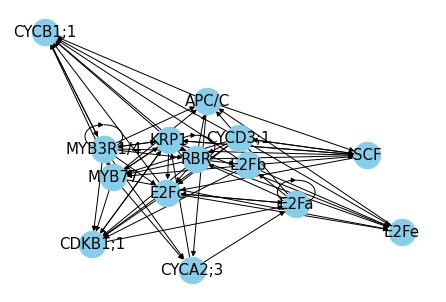

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB77,E2Fb,RBR
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]]
environment:    MYB77,E2Fb,RBR,KRP1,CYCD3;1,E2Fa,MYB3R1/4
un:  1.0054910091785776
un_en:  1.3341177761984517
syn:  0.2362382874935971
------------------------------------------------------------------------------------------------------------------------


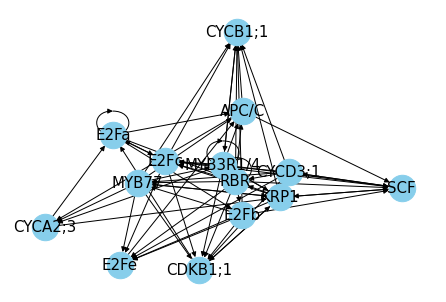

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB77,E2Fb,CYCB1;1
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]
environment:    MYB77,E2Fb,CYCB1;1,KRP1,RBR,CYCD3;1,E2Fa,E2Fc,MYB3R1/4,APC/C
un:  0.5205933672055658
un_en:  1.7989411599045515
syn:  0.3153441327944342
------------------------------------------------------------------------------------------------------------------------


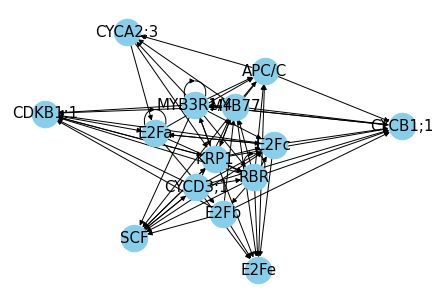

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB77,CDKB1;1,RBR
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
environment:    MYB77,CDKB1;1,RBR,KRP1,E2Fb,CYCD3;1,E2Fc,MYB3R1/4,E2Fa
un:  0.533537099549696
un_en:  1.6422755034104193
syn:  0.35708790045030403
------------------------------------------------------------------------------------------------------------------------


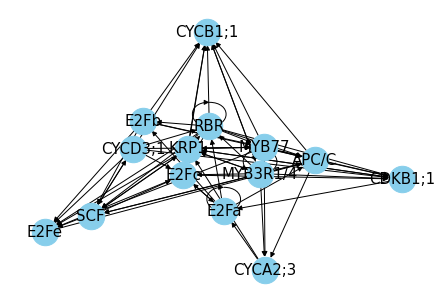

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB77,CDKB1;1,CYCD3;1
tpm: 
[[0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]]
environment:    MYB77,CDKB1;1,CYCD3;1,KRP1,E2Fb,RBR,E2Fc,MYB3R1/4,SCF
un:  0.2702875609612967
un_en:  2.076780831600085
syn:  0.2765874390387033
------------------------------------------------------------------------------------------------------------------------


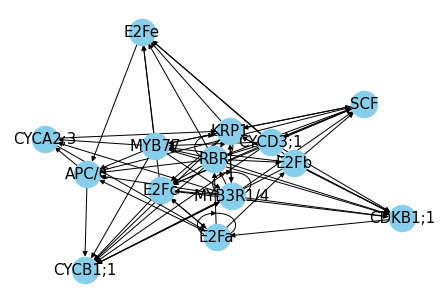

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB77,RBR,CYCD3;1
tpm: 
[[0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]]
environment:    MYB77,RBR,CYCD3;1,KRP1,E2Fb,MYB3R1/4,E2Fa,SCF
un:  0.32632722306559514
un_en:  2.072595489354228
syn:  0.4938325424917964
------------------------------------------------------------------------------------------------------------------------


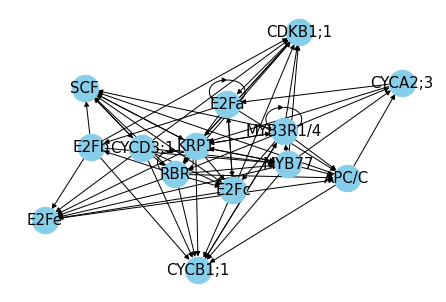

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB77,RBR,CYCB1;1
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]]
environment:    MYB77,RBR,CYCB1;1,KRP1,E2Fb,CYCD3;1,MYB3R1/4,E2Fa,E2Fc,APC/C
un:  0.2638399182176729
un_en:  2.1624237265727997
syn:  0.4158475817823271
------------------------------------------------------------------------------------------------------------------------


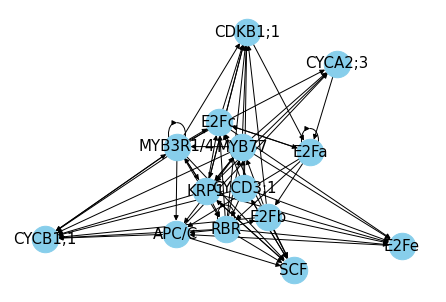

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB77,RBR,APC/C
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]]
environment:    MYB77,RBR,APC/C,KRP1,E2Fb,CYCD3;1,MYB3R1/4,E2Fa,E2Fe
un:  0.26159633688453093
un_en:  2.1766638117334454
syn:  0.40438110450481696
------------------------------------------------------------------------------------------------------------------------


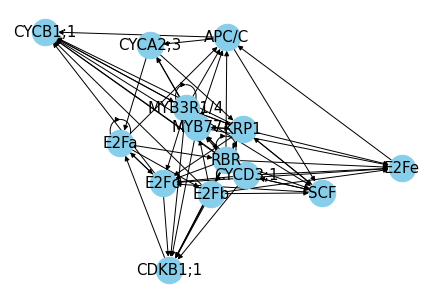

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB77,CYCD3;1,CYCB1;1
tpm: 
[[0. 0. 1. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]
environment:    MYB77,CYCD3;1,CYCB1;1,KRP1,E2Fb,RBR,SCF,E2Fc,MYB3R1/4,APC/C
un:  0.050316942703724665
un_en:  2.5252426746356265
syn:  0.28562055729627533
------------------------------------------------------------------------------------------------------------------------


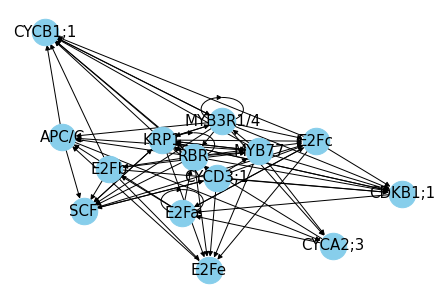

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB77,CYCB1;1,APC/C
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]
environment:    MYB77,CYCB1;1,APC/C,KRP1,E2Fb,RBR,CYCD3;1,E2Fc,MYB3R1/4,E2Fe,E2Fa
un:  0.7720587967372782
un_en:  1.7647165204754827
syn:  0.2847550947248426
------------------------------------------------------------------------------------------------------------------------


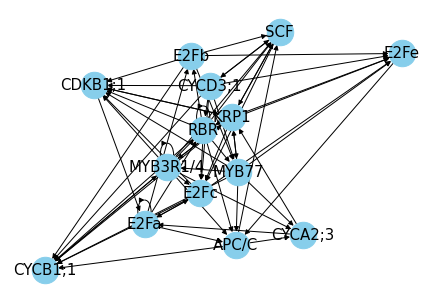

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB77,CYCA2;3,APC/C
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]
environment:    MYB77,CYCA2;3,APC/C,KRP1,E2Fb,RBR,CYCD3;1,MYB3R1/4,E2Fe,E2Fa
un:  0.7479728202751393
un_en:  1.7736849398180556
syn:  0.28680159361834046
------------------------------------------------------------------------------------------------------------------------


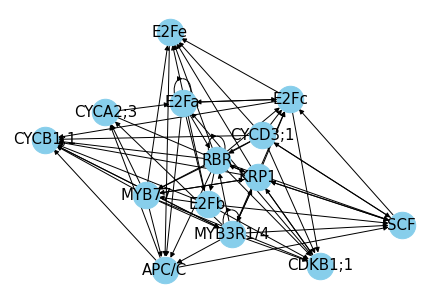

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    E2Fe,KRP1,E2Fc
tpm: 
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]]
environment:    E2Fe,KRP1,E2Fc,MYB77,E2Fb,RBR,CYCD3;1,MYB3R1/4,SCF,CDKB1;1,CYCA2;3,E2Fa
un:  0.08203104998356206
un_en:  2.2970304668698382
syn:  0.281538017310515
------------------------------------------------------------------------------------------------------------------------


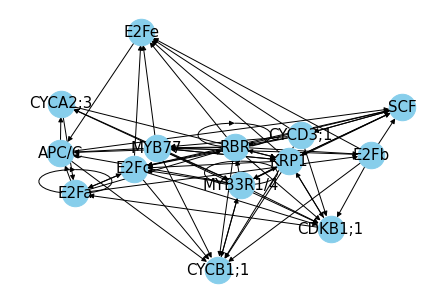

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    E2Fe,KRP1,RBR
tpm: 
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]]
environment:    E2Fe,KRP1,RBR,MYB77,E2Fc,E2Fb,CYCD3;1,MYB3R1/4,SCF,CDKB1;1,CYCA2;3,E2Fa
un:  0.16660678474552124
un_en:  2.122873586150309
syn:  0.4297865256745885
------------------------------------------------------------------------------------------------------------------------


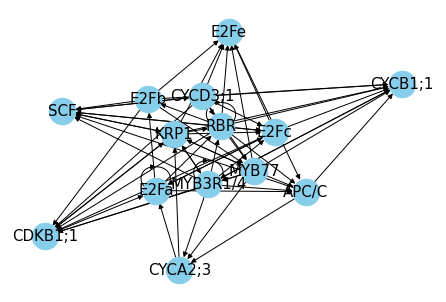

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    E2Fe,E2Fc,RBR
tpm: 
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]]
environment:    E2Fe,E2Fc,RBR,MYB77,KRP1,E2Fb,CYCD3;1,MYB3R1/4,SCF,E2Fa
un:  0.05826732705712222
un_en:  1.8776756113563984
syn:  0.36050615919494344
------------------------------------------------------------------------------------------------------------------------


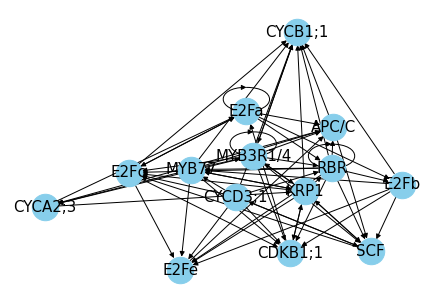

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    E2Fe,E2Fc,CYCD3;1
tpm: 
[[0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 1. 0.]]
environment:    E2Fe,E2Fc,CYCD3;1,MYB77,KRP1,E2Fb,RBR,MYB3R1/4,SCF,E2Fa
un:  0.06846428028869533
un_en:  2.5933383353767585
syn:  0.29510478700538123
------------------------------------------------------------------------------------------------------------------------


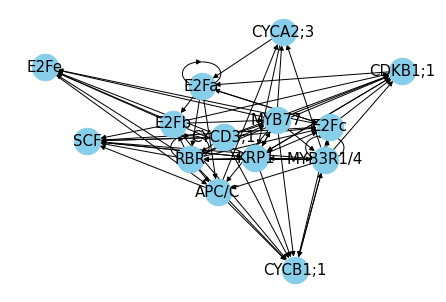

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    E2Fe,E2Fb,RBR
tpm: 
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 ...
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]]
environment:    E2Fe,E2Fb,RBR,MYB77,KRP1,E2Fc,CYCD3;1,E2Fa,MYB3R1/4
un:  0.3281245319885794
un_en:  2.0861147029505998
syn:  0.2948077921794643
------------------------------------------------------------------------------------------------------------------------


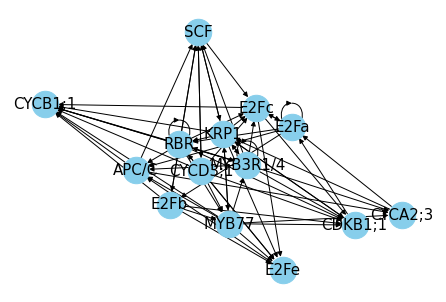

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    E2Fe,RBR,CYCD3;1
tpm: 
[[0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 ...
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 1. 0.]]
environment:    E2Fe,RBR,CYCD3;1,MYB77,KRP1,E2Fc,E2Fb,MYB3R1/4,E2Fa,SCF
un:  0.11020145339886253
un_en:  2.3807190012766983
syn:  0.4861918570212471
------------------------------------------------------------------------------------------------------------------------


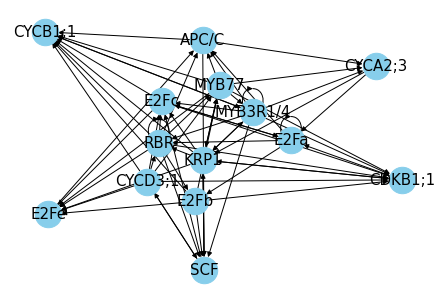

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    E2Fe,RBR,APC/C
tpm: 
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 1. 0.]]
environment:    E2Fe,RBR,APC/C,MYB77,KRP1,E2Fc,E2Fb,CYCD3;1,MYB3R1/4,E2Fa
un:  0.7714047189769329
un_en:  1.8103147031092344
syn:  0.30863522241241514
------------------------------------------------------------------------------------------------------------------------


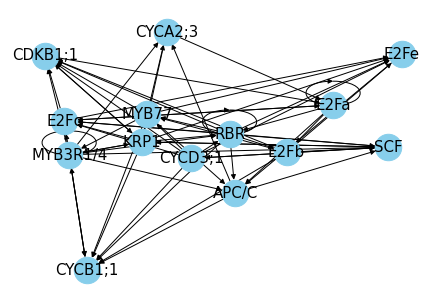

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    KRP1,E2Fc,MYB3R1/4
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
environment:    KRP1,E2Fc,MYB3R1/4,MYB77,SCF,CDKB1;1,CYCA2;3,RBR,CYCD3;1,E2Fa,CYCB1;1
un:  0.6237766853079403
un_en:  1.516100666914424
syn:  0.4161287345547777
------------------------------------------------------------------------------------------------------------------------


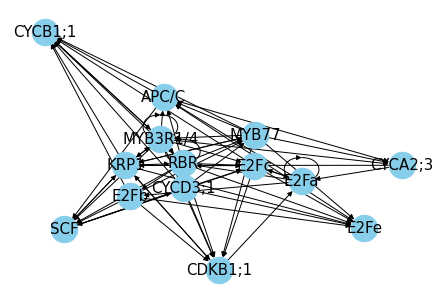

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    KRP1,E2Fc,SCF
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]]
environment:    KRP1,E2Fc,SCF,MYB77,MYB3R1/4,CDKB1;1,CYCA2;3,RBR,CYCD3;1,E2Fa,E2Fb,APC/C
un:  0.11071450747106343
un_en:  2.2338541656442312
syn:  0.33967316329638336
------------------------------------------------------------------------------------------------------------------------


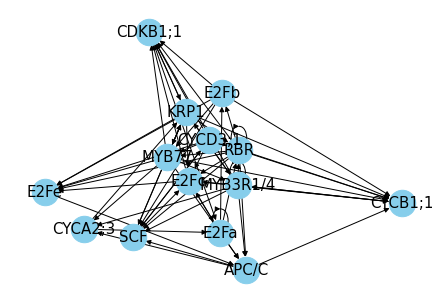

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    KRP1,E2Fc,CDKB1;1
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
environment:    KRP1,E2Fc,CDKB1;1,MYB77,MYB3R1/4,SCF,CYCA2;3,RBR,CYCD3;1,E2Fa,E2Fb
un:  0.12104634971285955
un_en:  1.7109695265580909
syn:  0.31055609167648834
------------------------------------------------------------------------------------------------------------------------


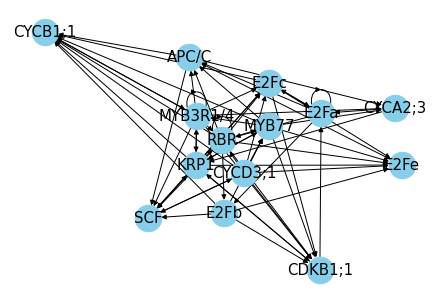

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    KRP1,E2Fc,RBR
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
environment:    KRP1,E2Fc,RBR,MYB77,MYB3R1/4,SCF,CDKB1;1,CYCA2;3,CYCD3;1,E2Fa
un:  0.18205729180542296
un_en:  1.6367220243593124
syn:  0.33739759097327293
------------------------------------------------------------------------------------------------------------------------


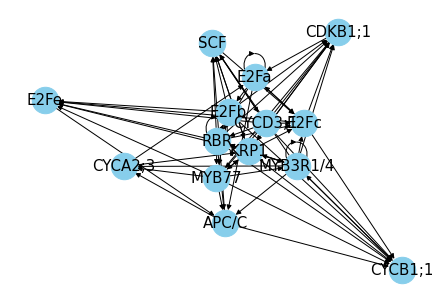

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    KRP1,E2Fc,CYCB1;1
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]]
environment:    KRP1,E2Fc,CYCB1;1,MYB77,MYB3R1/4,SCF,CDKB1;1,CYCA2;3,RBR,CYCD3;1,E2Fa,E2Fb,APC/C
un:  0.028824320235364454
un_en:  2.527320572296075
syn:  0.1713519004593095
------------------------------------------------------------------------------------------------------------------------


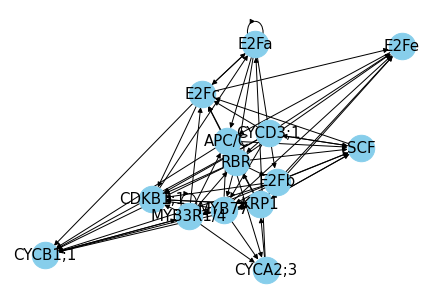

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    KRP1,MYB3R1/4,SCF
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]]
environment:    KRP1,MYB3R1/4,SCF,MYB77,CDKB1;1,CYCA2;3,CYCB1;1,E2Fb,RBR,CYCD3;1,APC/C
un:  0.52242629081301
un_en:  1.6275185338473726
syn:  0.43947446977077087
------------------------------------------------------------------------------------------------------------------------


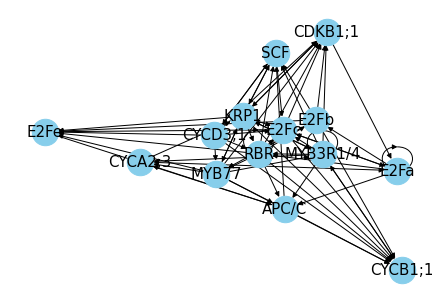

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    KRP1,MYB3R1/4,CDKB1;1
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
environment:    KRP1,MYB3R1/4,CDKB1;1,MYB77,SCF,CYCA2;3,CYCB1;1,E2Fc,E2Fb,RBR,CYCD3;1
un:  0.5120526106236744
un_en:  1.1081524904178712
syn:  0.3038684252846796
------------------------------------------------------------------------------------------------------------------------


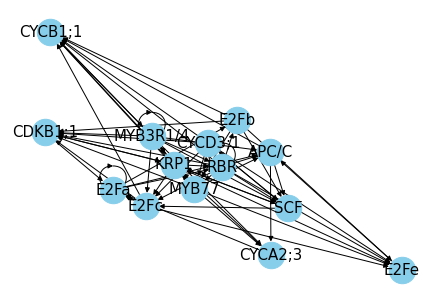

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    KRP1,MYB3R1/4,RBR
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
environment:    KRP1,MYB3R1/4,RBR,MYB77,SCF,CDKB1;1,CYCA2;3,CYCB1;1,CYCD3;1,E2Fa
un:  0.76169218793369
un_en:  1.3755552914039373
syn:  0.4613473376679358
------------------------------------------------------------------------------------------------------------------------


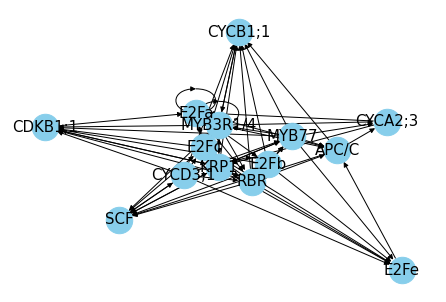

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    KRP1,MYB3R1/4,CYCB1;1
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]]
environment:    KRP1,MYB3R1/4,CYCB1;1,MYB77,SCF,CDKB1;1,CYCA2;3,E2Fc,E2Fb,RBR,CYCD3;1,APC/C
un:  0.4478330380748078
un_en:  1.8996362120273713
syn:  0.2313064397898329
------------------------------------------------------------------------------------------------------------------------


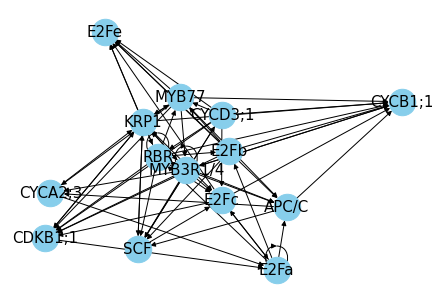

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    KRP1,MYB3R1/4,CYCA2;3
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]]
environment:    KRP1,MYB3R1/4,CYCA2;3,MYB77,SCF,CDKB1;1,CYCB1;1,APC/C
un:  0.5013257214064276
un_en:  1.7314972659073065
syn:  0.27555156187965146
------------------------------------------------------------------------------------------------------------------------


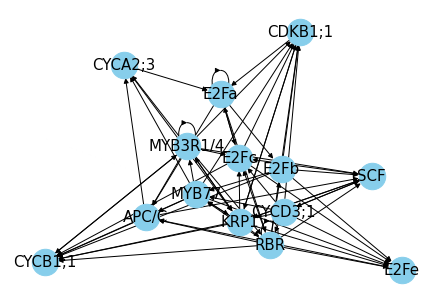

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    KRP1,SCF,RBR
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]]
environment:    KRP1,SCF,RBR,MYB77,MYB3R1/4,CDKB1;1,CYCA2;3,E2Fb,CYCD3;1,APC/C,E2Fa
un:  0.22700293680731026
un_en:  1.9933497720406348
syn:  0.5150318287500815
------------------------------------------------------------------------------------------------------------------------


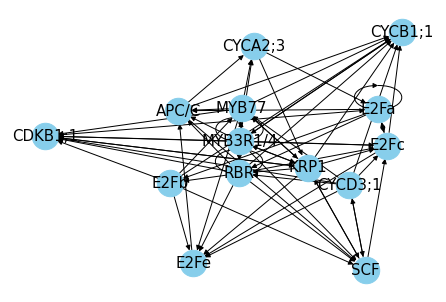

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    KRP1,CDKB1;1,RBR
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
environment:    KRP1,CDKB1;1,RBR,MYB77,MYB3R1/4,SCF,CYCA2;3,E2Fc,E2Fb,CYCD3;1,E2Fa
un:  0.22578649497984266
un_en:  1.4748968885514688
syn:  0.47718577057754913
------------------------------------------------------------------------------------------------------------------------


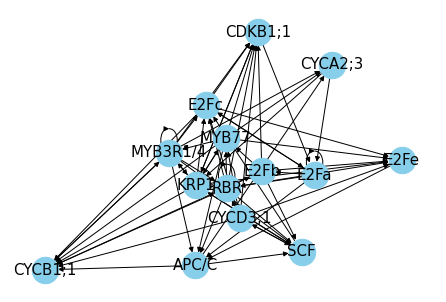

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    KRP1,RBR,CYCB1;1
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]]
environment:    KRP1,RBR,CYCB1;1,MYB77,MYB3R1/4,SCF,CDKB1;1,CYCA2;3,CYCD3;1,E2Fa,E2Fc,E2Fb,APC/C
un:  0.1314854805470412
un_en:  2.269126496699652
syn:  0.3644555350103508
------------------------------------------------------------------------------------------------------------------------


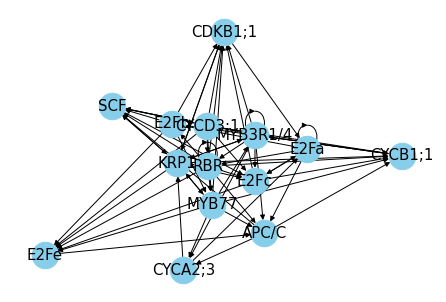

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    E2Fc,MYB3R1/4,SCF
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 1. 0.]]
environment:    E2Fc,MYB3R1/4,SCF,KRP1,RBR,CYCD3;1,E2Fa,MYB77,CYCB1;1,E2Fb,APC/C
un:  0.4721950490226424
un_en:  1.9118023694473125
syn:  0.4473538156664071
------------------------------------------------------------------------------------------------------------------------


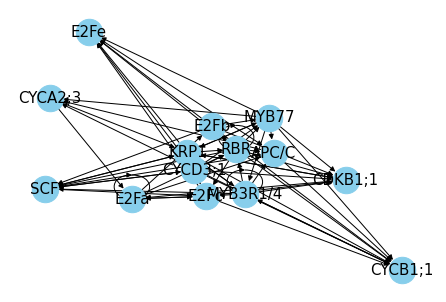

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    E2Fc,MYB3R1/4,CDKB1;1
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]]
environment:    E2Fc,MYB3R1/4,CDKB1;1,KRP1,SCF,RBR,CYCD3;1,E2Fa,MYB77,CYCB1;1,E2Fb
un:  0.5525415115247077
un_en:  1.4190489967458992
syn:  0.31335369108031985
------------------------------------------------------------------------------------------------------------------------


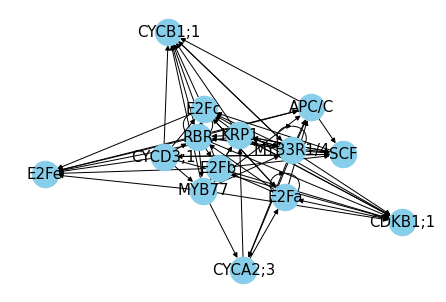

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    E2Fc,MYB3R1/4,RBR
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]]
environment:    E2Fc,MYB3R1/4,RBR,KRP1,SCF,CYCD3;1,E2Fa,MYB77,CYCB1;1
un:  0.48897390896465714
un_en:  1.4443945653585148
syn:  0.3669941084021922
------------------------------------------------------------------------------------------------------------------------


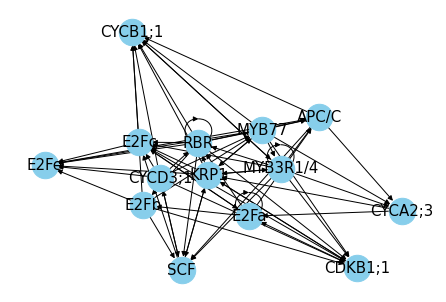

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    E2Fc,MYB3R1/4,CYCB1;1
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 1. 0.]]
environment:    E2Fc,MYB3R1/4,CYCB1;1,KRP1,SCF,RBR,CYCD3;1,E2Fa,MYB77,E2Fb,APC/C
un:  0.44502941524251116
un_en:  1.9623393333317436
syn:  0.45381045288352184
------------------------------------------------------------------------------------------------------------------------


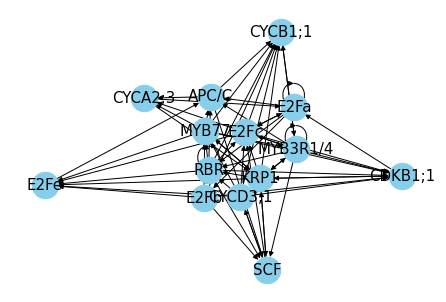

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    E2Fc,SCF,RBR
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 1. 0. 0.]]
environment:    E2Fc,SCF,RBR,KRP1,MYB3R1/4,CYCD3;1,E2Fa,E2Fb,APC/C
un:  0.14969196624338102
un_en:  1.7592484043999357
syn:  0.2603879165353148
------------------------------------------------------------------------------------------------------------------------


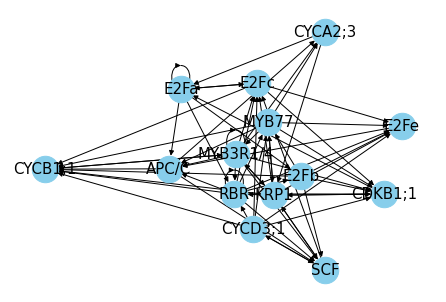

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    E2Fc,SCF,CYCD3;1
tpm: 
[[0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
environment:    E2Fc,SCF,CYCD3;1,KRP1,MYB3R1/4,RBR,E2Fa,E2Fb,APC/C
un:  1.0510599814270862
un_en:  1.6353534782960188
syn:  0.13644001857291377
------------------------------------------------------------------------------------------------------------------------


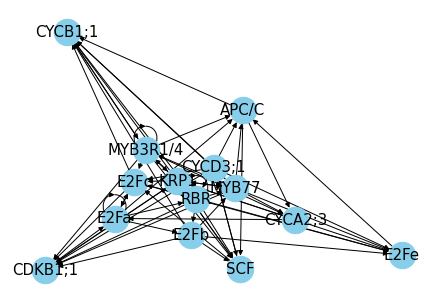

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    E2Fc,CDKB1;1,RBR
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]]
environment:    E2Fc,CDKB1;1,RBR,KRP1,MYB3R1/4,SCF,CYCD3;1,E2Fa,MYB77,E2Fb
un:  0.08159771681635407
un_en:  1.6484038836637813
syn:  0.2298684452676678
------------------------------------------------------------------------------------------------------------------------


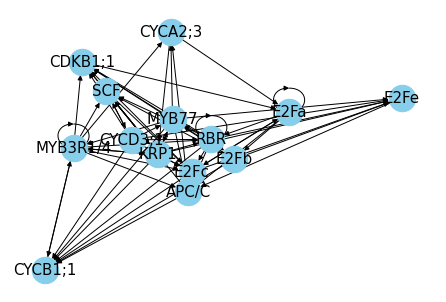

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    E2Fc,CDKB1;1,CYCD3;1
tpm: 
[[0. 1. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 1. 0.]]
environment:    E2Fc,CDKB1;1,CYCD3;1,KRP1,MYB3R1/4,SCF,RBR,E2Fa,MYB77,E2Fb
un:  0.052340886433779904
un_en:  2.370522377426994
syn:  0.191761554955568
------------------------------------------------------------------------------------------------------------------------


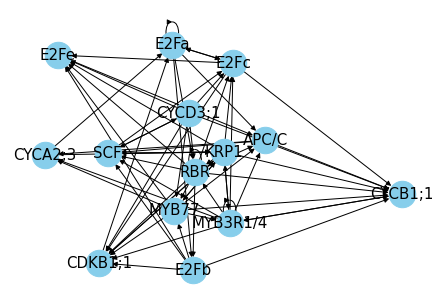

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    E2Fc,CDKB1;1,E2Fa
tpm: 
[[0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 1. 0.]]
environment:    E2Fc,CDKB1;1,E2Fa,KRP1,MYB3R1/4,SCF,RBR,CYCD3;1,MYB77,E2Fb,CYCA2;3
un:  0.6796535819225658
un_en:  1.4971892722788953
syn:  0.43854725342808853
------------------------------------------------------------------------------------------------------------------------


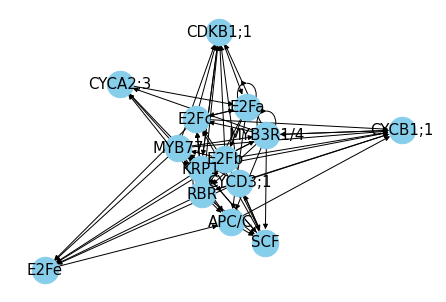

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    E2Fc,RBR,CYCD3;1
tpm: 
[[0. 1. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 1. 0.]]
environment:    E2Fc,RBR,CYCD3;1,KRP1,MYB3R1/4,SCF,E2Fa
un:  0.1731383022079065
un_en:  1.709876732024398
syn:  0.3463165805707893
------------------------------------------------------------------------------------------------------------------------


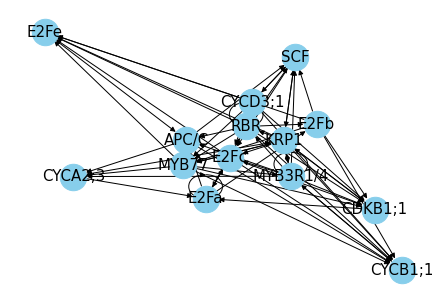

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    E2Fc,RBR,CYCB1;1
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 1. 0.]]
environment:    E2Fc,RBR,CYCB1;1,KRP1,MYB3R1/4,SCF,CYCD3;1,E2Fa,MYB77,E2Fb,APC/C
un:  0.03972285308939767
un_en:  2.0027849316019894
syn:  0.2253852279526133
------------------------------------------------------------------------------------------------------------------------


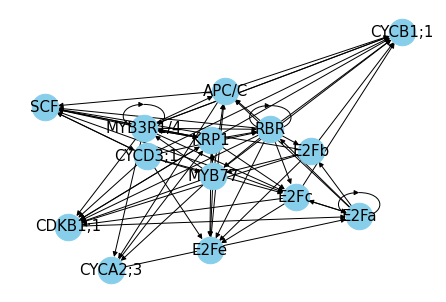

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    E2Fc,RBR,E2Fa
tpm: 
[[0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 1. 0.]]
environment:    E2Fc,RBR,E2Fa,KRP1,MYB3R1/4,SCF,CYCD3;1,CDKB1;1,CYCA2;3
un:  0.4915013235441491
un_en:  1.3777676310730669
syn:  0.4316776800747659
------------------------------------------------------------------------------------------------------------------------


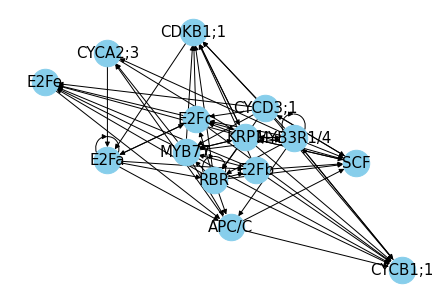

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    E2Fc,CYCD3;1,CYCB1;1
tpm: 
[[0. 0. 1. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
environment:    E2Fc,CYCD3;1,CYCB1;1,KRP1,MYB3R1/4,SCF,RBR,E2Fa,MYB77,E2Fb,APC/C
un:  0.03953073765100794
un_en:  2.7252467958984288
syn:  0.160645483043666
------------------------------------------------------------------------------------------------------------------------


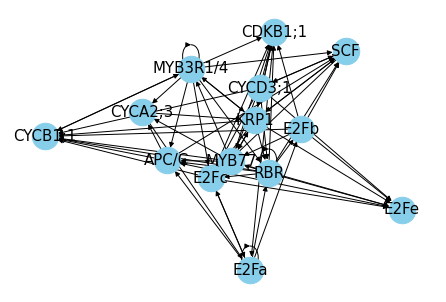

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB3R1/4,SCF,RBR
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]]
environment:    MYB3R1/4,SCF,RBR,MYB77,KRP1,CYCB1;1,E2Fb,CYCD3;1,APC/C,E2Fa
un:  0.452823598844562
un_en:  1.9368848674138597
syn:  0.4633652926175589
------------------------------------------------------------------------------------------------------------------------


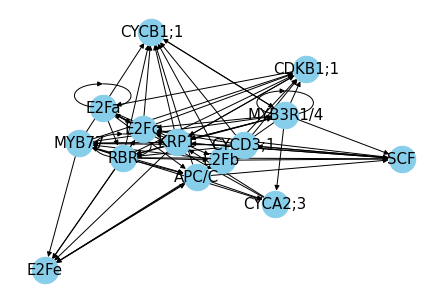

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB3R1/4,SCF,APC/C
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
environment:    MYB3R1/4,SCF,APC/C,MYB77,KRP1,CYCB1;1,E2Fb,RBR,CYCD3;1,E2Fe,E2Fa
un:  0.7447888507203055
un_en:  1.7524164920069163
syn:  0.33272521150926226
------------------------------------------------------------------------------------------------------------------------


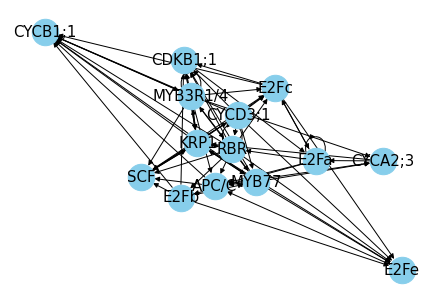

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB3R1/4,CDKB1;1,RBR
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]]
environment:    MYB3R1/4,CDKB1;1,RBR,MYB77,KRP1,CYCB1;1,E2Fc,E2Fb,CYCD3;1,E2Fa
un:  0.5543153093184526
un_en:  1.3967204953925803
syn:  0.3599586407543204
------------------------------------------------------------------------------------------------------------------------


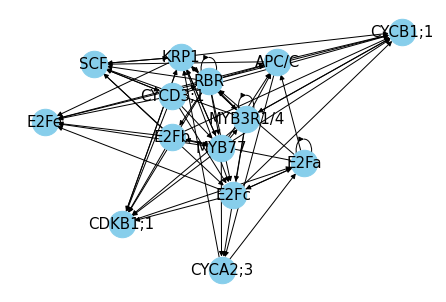

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB3R1/4,RBR,CYCB1;1
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 1. 0.]]
environment:    MYB3R1/4,RBR,CYCB1;1,MYB77,KRP1,CYCD3;1,E2Fa,E2Fc,E2Fb,APC/C
un:  0.4649950503671474
un_en:  1.9315070728693837
syn:  0.4779443049156805
------------------------------------------------------------------------------------------------------------------------


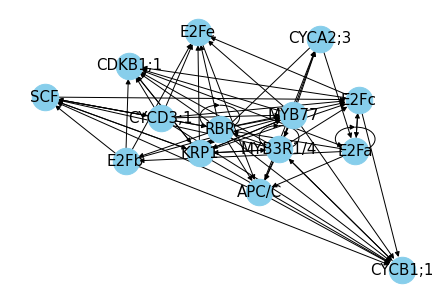

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB3R1/4,RBR,APC/C
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 1. 0.]]
environment:    MYB3R1/4,RBR,APC/C,MYB77,KRP1,CYCB1;1,CYCD3;1,E2Fa,E2Fe
un:  0.4147573503821018
un_en:  2.0620151674161455
syn:  0.38460822559539953
------------------------------------------------------------------------------------------------------------------------


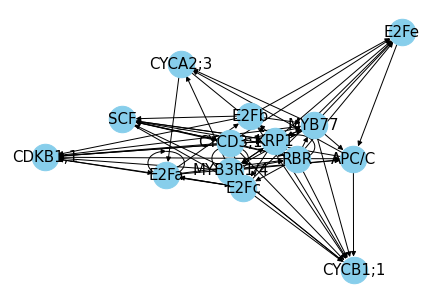

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB3R1/4,CYCB1;1,APC/C
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
environment:    MYB3R1/4,CYCB1;1,APC/C,MYB77,KRP1,E2Fc,E2Fb,RBR,CYCD3;1,E2Fe,E2Fa
un:  0.9226272893466574
un_en:  1.6174974272324545
syn:  0.2986036455343446
------------------------------------------------------------------------------------------------------------------------


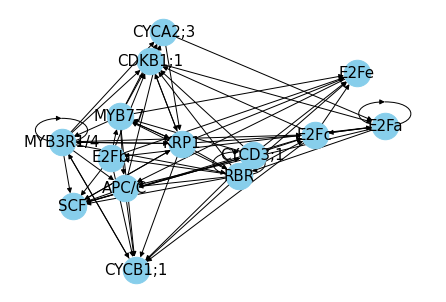

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    MYB3R1/4,CYCA2;3,APC/C
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
environment:    MYB3R1/4,CYCA2;3,APC/C,MYB77,KRP1,CYCB1;1,E2Fe,RBR,E2Fa
un:  0.9380858903635128
un_en:  1.7126131922057852
syn:  0.1504949200565966
------------------------------------------------------------------------------------------------------------------------


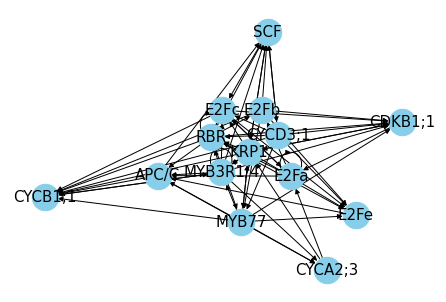

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    E2Fb,SCF,RBR
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]]
environment:    E2Fb,SCF,RBR,E2Fa,KRP1,MYB3R1/4,CYCD3;1,APC/C
un:  0.3610335470377954
un_en:  1.9027531288092885
syn:  0.3243987771302484
------------------------------------------------------------------------------------------------------------------------


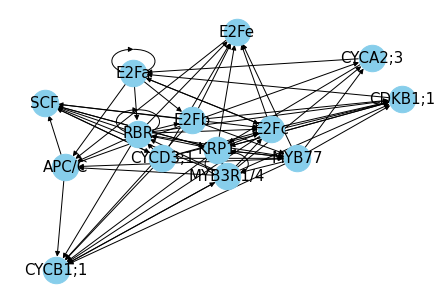

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    E2Fb,CDKB1;1,RBR
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
environment:    E2Fb,CDKB1;1,RBR,E2Fa,MYB77,KRP1,E2Fc,MYB3R1/4,CYCD3;1
un:  0.3239049578495309
un_en:  1.7491044616721658
syn:  0.268811204234491
------------------------------------------------------------------------------------------------------------------------


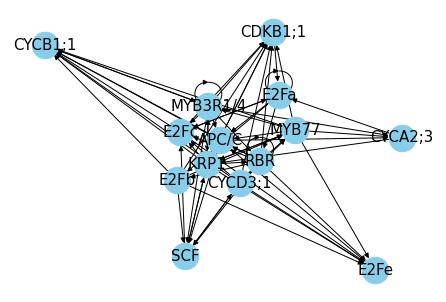

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    E2Fb,CDKB1;1,E2Fa
tpm: 
[[0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]]
environment:    E2Fb,CDKB1;1,E2Fa,RBR,MYB77,KRP1,E2Fc,MYB3R1/4,CYCD3;1,CYCA2;3
un:  0.5745729896334364
un_en:  1.388751403843787
syn:  0.5424617759239556
------------------------------------------------------------------------------------------------------------------------


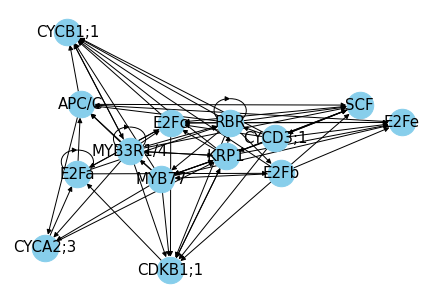

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    E2Fb,RBR,CYCB1;1
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]]
environment:    E2Fb,RBR,CYCB1;1,E2Fa,KRP1,MYB3R1/4,CYCD3;1,MYB77,E2Fc,APC/C
un:  0.31389326749898794
un_en:  2.1348762350116264
syn:  0.23246481354302306
------------------------------------------------------------------------------------------------------------------------


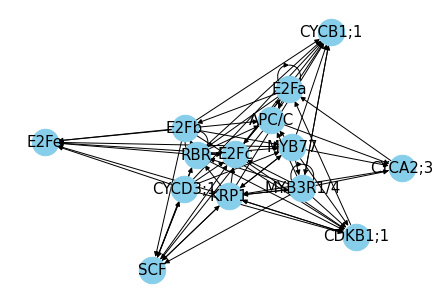

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    E2Fb,RBR,E2Fa
tpm: 
[[0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]]
environment:    E2Fb,RBR,E2Fa,KRP1,MYB3R1/4,CYCD3;1,E2Fc,CDKB1;1,CYCA2;3
un:  0.8812415918818671
un_en:  1.6131938610954653
syn:  0.18830723590509202
------------------------------------------------------------------------------------------------------------------------


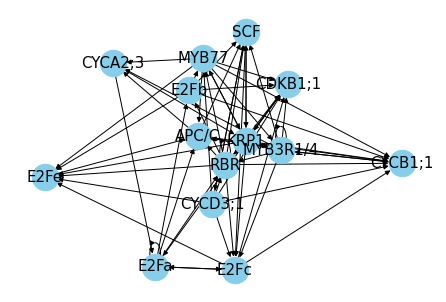

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    SCF,RBR,CYCD3;1
tpm: 
[[0. 1. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]]
environment:    SCF,RBR,CYCD3;1,KRP1,MYB3R1/4,E2Fb,APC/C,E2Fa
un:  1.1608489381886962
un_en:  1.3124174881674524
syn:  0.3936858273686954
------------------------------------------------------------------------------------------------------------------------


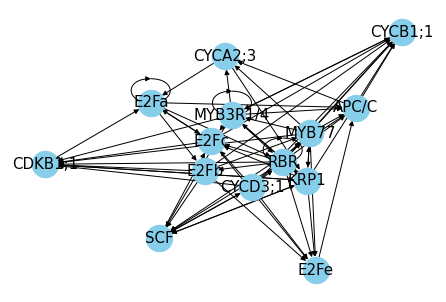

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    SCF,RBR,APC/C
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]]
environment:    SCF,RBR,APC/C,KRP1,MYB3R1/4,E2Fb,CYCD3;1,E2Fa,MYB77,E2Fe
un:  0.5656508013756161
un_en:  1.9267876520599136
syn:  0.3229065227924278
------------------------------------------------------------------------------------------------------------------------


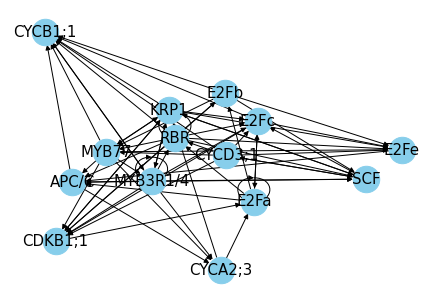

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    CDKB1;1,RBR,CYCD3;1
tpm: 
[[0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 1. 0.]]
environment:    CDKB1;1,RBR,CYCD3;1,MYB77,KRP1,E2Fc,MYB3R1/4,E2Fb,E2Fa,SCF
un:  0.14860798621205282
un_en:  2.1483863759630797
syn:  0.36686427934533894
------------------------------------------------------------------------------------------------------------------------


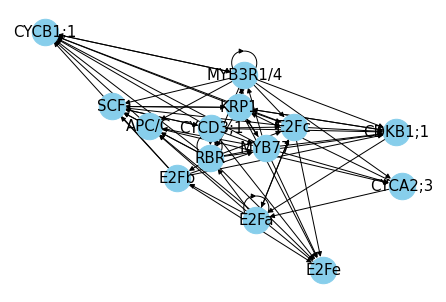

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    CDKB1;1,RBR,E2Fa
tpm: 
[[0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 1. 0.]]
environment:    CDKB1;1,RBR,E2Fa,MYB77,KRP1,E2Fc,MYB3R1/4,E2Fb,CYCD3;1,CYCA2;3
un:  0.41696821134330647
un_en:  1.6413450977900728
syn:  0.586267007545693
------------------------------------------------------------------------------------------------------------------------


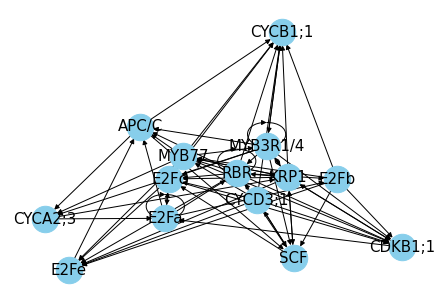

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    RBR,CYCD3;1,CYCB1;1
tpm: 
[[0. 0. 1. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
environment:    RBR,CYCD3;1,CYCB1;1,KRP1,MYB3R1/4,E2Fa,SCF,MYB77,E2Fc,E2Fb,APC/C
un:  0.10896824765497186
un_en:  2.4565787208984613
syn:  0.3869727679024197
------------------------------------------------------------------------------------------------------------------------


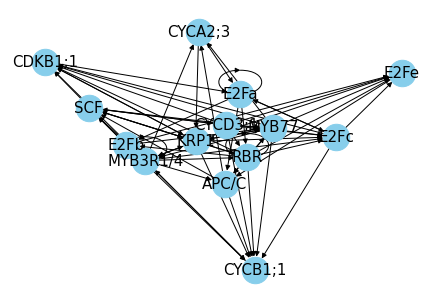

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    RBR,CYCB1;1,APC/C
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
environment:    RBR,CYCB1;1,APC/C,KRP1,MYB3R1/4,CYCD3;1,E2Fa,MYB77,E2Fc,E2Fb,E2Fe
un:  0.6970778115409194
un_en:  1.8865340752492399
syn:  0.3024052695010916
------------------------------------------------------------------------------------------------------------------------


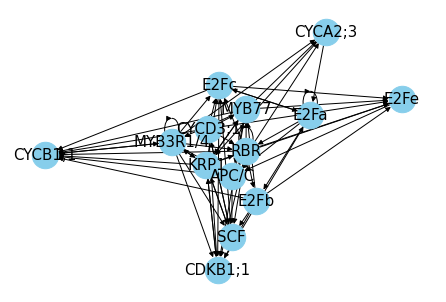

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    RBR,E2Fa,APC/C
tpm: 
[[0. 0. 1. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
environment:    RBR,E2Fa,APC/C,KRP1,MYB3R1/4,CYCD3;1,E2Fc,CDKB1;1,CYCA2;3,MYB77,E2Fe
un:  0.187410773250004
un_en:  2.2761065179764954
syn:  0.4697496880384483
------------------------------------------------------------------------------------------------------------------------


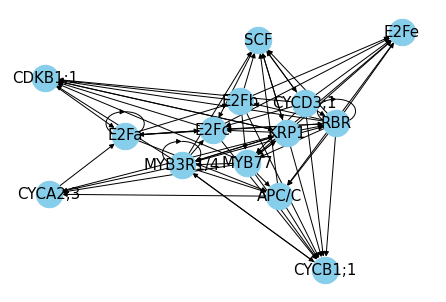

all intrinsic variables: MYB77,E2Fe,KRP1,E2Fc,MYB3R1/4,E2Fb,SCF,CDKB1;1,RBR,CYCD3;1,CYCB1;1,E2Fa,CYCA2;3,APC/C
external parameters:
mechanism:    E2Fa,CYCA2;3,APC/C
tpm: 
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]
environment:    E2Fa,CYCA2;3,APC/C,E2Fc,CDKB1;1,MYB77,MYB3R1/4,E2Fe,RBR
un:  0.8812695982692345
un_en:  1.4063856167755362
syn:  0.6135612121508756
------------------------------------------------------------------------------------------------------------------------


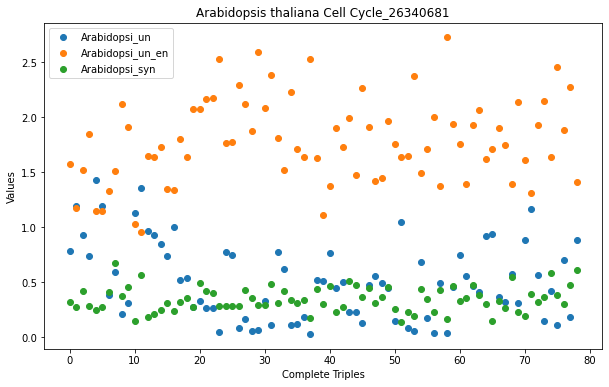

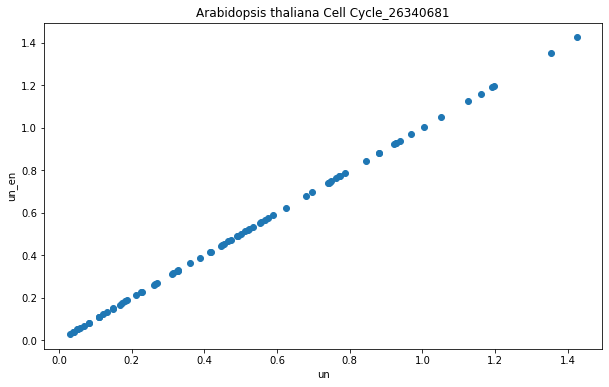

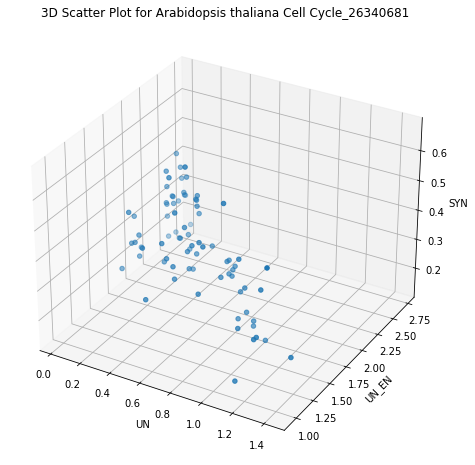

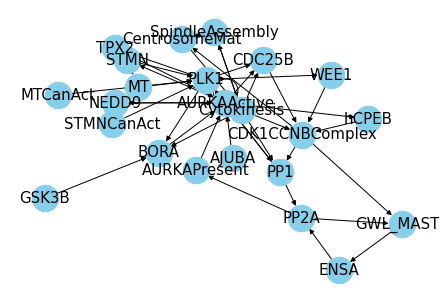

all intrinsic variables: hCPEB,Cytokinesis,AURKAPresent,PP1,TPX2,GWL_MASTL,NEDD9,BORA,ENSA,AURKAActive,STMN,SpindleAssembly,PLK1,PP2A,MT,CDK1CCNBComplex,WEE1,CDC25B,CentrosomeMat
external parameters:STMNCanAct,MTCanAct,AJUBA,GSK3B
mechanism:    Cytokinesis,PP1,CDK1CCNBComplex
tpm: 
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]
environment:    Cytokinesis,PP1,CDK1CCNBComplex,SpindleAssembly,CentrosomeMat,AURKAActive,hCPEB,WEE1,CDC25B
un:  0.9248575295590921
un_en:  1.1134629928393274
syn:  0.21959735321960394
------------------------------------------------------------------------------------------------------------------------


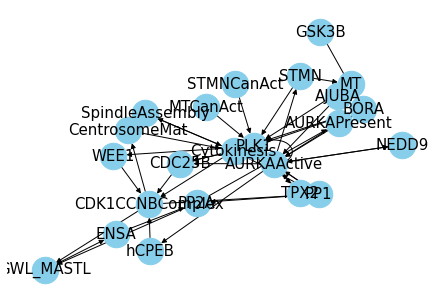

all intrinsic variables: hCPEB,Cytokinesis,AURKAPresent,PP1,TPX2,GWL_MASTL,NEDD9,BORA,ENSA,AURKAActive,STMN,SpindleAssembly,PLK1,PP2A,MT,CDK1CCNBComplex,WEE1,CDC25B,CentrosomeMat
external parameters:STMNCanAct,MTCanAct,AJUBA,GSK3B
mechanism:    Cytokinesis,SpindleAssembly,CentrosomeMat
tpm: 
[[1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]]
environment:    Cytokinesis,SpindleAssembly,CentrosomeMat,CDK1CCNBComplex
un:  1.6800365325772657
un_en:  0.35221700146248247
syn:  0.14778299853751742
------------------------------------------------------------------------------------------------------------------------


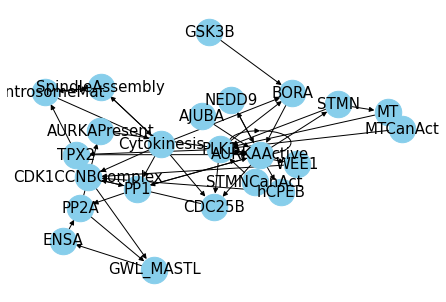

all intrinsic variables: hCPEB,Cytokinesis,AURKAPresent,PP1,TPX2,GWL_MASTL,NEDD9,BORA,ENSA,AURKAActive,STMN,SpindleAssembly,PLK1,PP2A,MT,CDK1CCNBComplex,WEE1,CDC25B,CentrosomeMat
external parameters:STMNCanAct,MTCanAct,AJUBA,GSK3B
mechanism:    Cytokinesis,CDK1CCNBComplex,CDC25B
tpm: 
[[0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]
environment:    Cytokinesis,CDK1CCNBComplex,CDC25B,SpindleAssembly,CentrosomeMat,hCPEB,WEE1,AURKAActive,PLK1
un:  0.9679469726908124
un_en:  1.3057288077155993
syn:  0.11400791008788358
------------------------------------------------------------------------------------------------------------------------


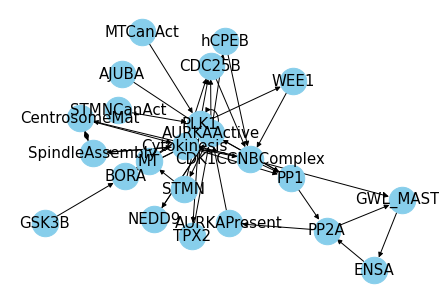

all intrinsic variables: hCPEB,Cytokinesis,AURKAPresent,PP1,TPX2,GWL_MASTL,NEDD9,BORA,ENSA,AURKAActive,STMN,SpindleAssembly,PLK1,PP2A,MT,CDK1CCNBComplex,WEE1,CDC25B,CentrosomeMat
external parameters:STMNCanAct,MTCanAct,AJUBA,GSK3B
mechanism:    Cytokinesis,CDK1CCNBComplex,CentrosomeMat
tpm: 
[[0. 0. 1. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]
environment:    Cytokinesis,CDK1CCNBComplex,CentrosomeMat,SpindleAssembly,hCPEB,WEE1,CDC25B
un:  1.4669171866886992
un_en:  0.6136994082884973
syn:  0.4080828133113008
------------------------------------------------------------------------------------------------------------------------


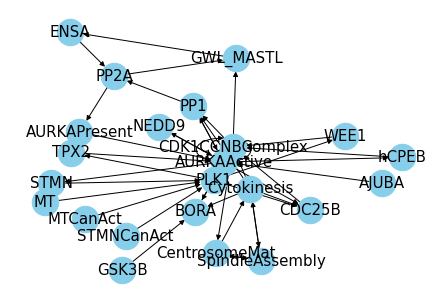

all intrinsic variables: hCPEB,Cytokinesis,AURKAPresent,PP1,TPX2,GWL_MASTL,NEDD9,BORA,ENSA,AURKAActive,STMN,SpindleAssembly,PLK1,PP2A,MT,CDK1CCNBComplex,WEE1,CDC25B,CentrosomeMat
external parameters:STMNCanAct,MTCanAct,AJUBA,GSK3B
mechanism:    TPX2,AURKAActive,PLK1
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]]
environment:    TPX2,AURKAActive,PLK1,AURKAPresent,PP1,NEDD9,BORA,AJUBA,STMN,MT,STMNCanAct,MTCanAct
un:  1.436621744512902
un_en:  0.8108907639447793
syn:  0.42254765852629683
------------------------------------------------------------------------------------------------------------------------


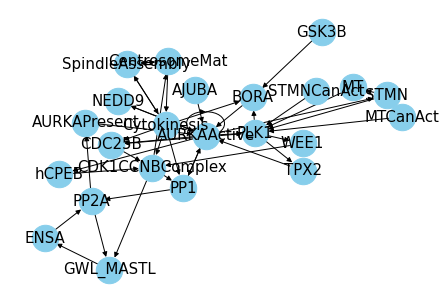

all intrinsic variables: hCPEB,Cytokinesis,AURKAPresent,PP1,TPX2,GWL_MASTL,NEDD9,BORA,ENSA,AURKAActive,STMN,SpindleAssembly,PLK1,PP2A,MT,CDK1CCNBComplex,WEE1,CDC25B,CentrosomeMat
external parameters:STMNCanAct,MTCanAct,AJUBA,GSK3B
mechanism:    GWL_MASTL,ENSA,PP2A
tpm: 
[[1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0.]


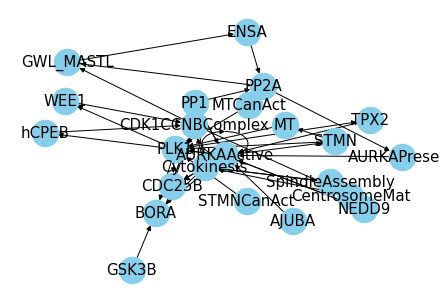

all intrinsic variables: hCPEB,Cytokinesis,AURKAPresent,PP1,TPX2,GWL_MASTL,NEDD9,BORA,ENSA,AURKAActive,STMN,SpindleAssembly,PLK1,PP2A,MT,CDK1CCNBComplex,WEE1,CDC25B,CentrosomeMat
external parameters:STMNCanAct,MTCanAct,AJUBA,GSK3B
mechanism:    BORA,AURKAActive,PLK1
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]]
environment:    BORA,AURKAActive,PLK1,Cytokinesis,GSK3B,AURKAPresent,PP1,TPX2,NEDD9,AJUBA,STMN,MT,STMNCanAct,MTCanAct
un:  0.43151867833310453
un_en:  1.6925040393011028
syn:  0.5004714522747348
------------------------------------------------------------------------------------------------------------------------


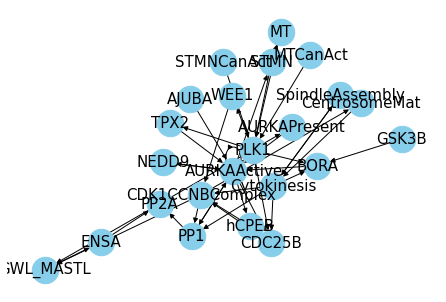

all intrinsic variables: hCPEB,Cytokinesis,AURKAPresent,PP1,TPX2,GWL_MASTL,NEDD9,BORA,ENSA,AURKAActive,STMN,SpindleAssembly,PLK1,PP2A,MT,CDK1CCNBComplex,WEE1,CDC25B,CentrosomeMat
external parameters:STMNCanAct,MTCanAct,AJUBA,GSK3B
mechanism:    AURKAActive,STMN,PLK1
tpm: 
[[0. 0. 1. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]]
environment:    AURKAActive,STMN,PLK1,AURKAPresent,PP1,TPX2,NEDD9,BORA,AJUBA,MT,STMNCanAct,MTCanAct
un:  1.0529216722982242
un_en:  1.1020187723974653
syn:  0.1345783277017758
------------------------------------------------------------------------------------------------------------------------


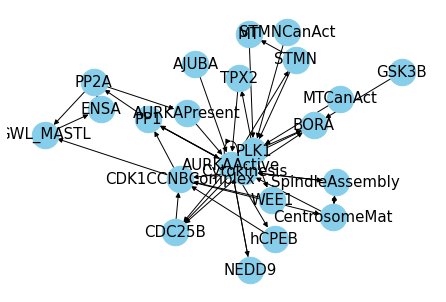

all intrinsic variables: hCPEB,Cytokinesis,AURKAPresent,PP1,TPX2,GWL_MASTL,NEDD9,BORA,ENSA,AURKAActive,STMN,SpindleAssembly,PLK1,PP2A,MT,CDK1CCNBComplex,WEE1,CDC25B,CentrosomeMat
external parameters:STMNCanAct,MTCanAct,AJUBA,GSK3B
mechanism:    AURKAActive,PLK1,CDC25B
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]]
environment:    AURKAActive,PLK1,CDC25B,AURKAPresent,PP1,TPX2,NEDD9,BORA,AJUBA,STMN,MT,STMNCanAct,MTCanAct,Cytokinesis
un:  0.5643931610566895
un_en:  1.6598278591502786
syn:  0.37969091324718074
------------------------------------------------------------------------------------------------------------------------


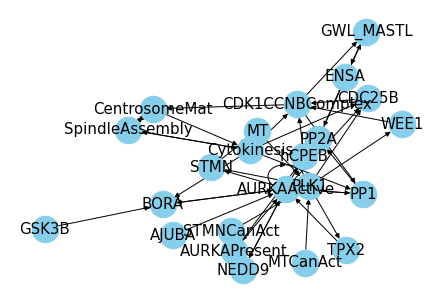

all intrinsic variables: hCPEB,Cytokinesis,AURKAPresent,PP1,TPX2,GWL_MASTL,NEDD9,BORA,ENSA,AURKAActive,STMN,SpindleAssembly,PLK1,PP2A,MT,CDK1CCNBComplex,WEE1,CDC25B,CentrosomeMat
external parameters:STMNCanAct,MTCanAct,AJUBA,GSK3B
mechanism:    STMN,PLK1,MT
tpm: 
[[0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0.

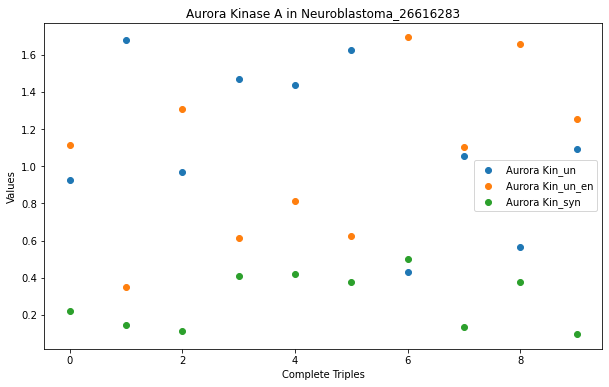

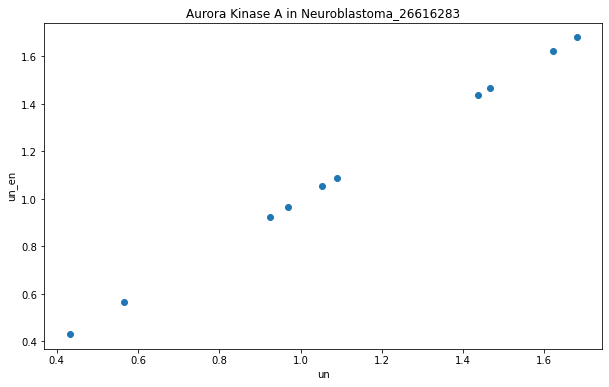

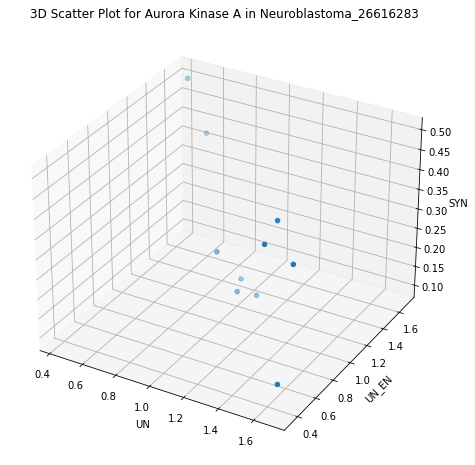

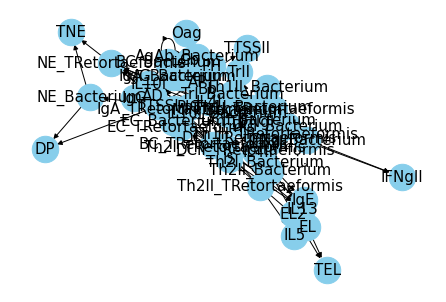

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    MPI_Bacterium,Bb,AP
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]]
environment:    MPI_Bacterium,Bb,AP,PIC,IFNg_Bacterium,PH,Cb,Th1I_Bacterium,IgG_Bacterium,AgAb_Bacterium
un:  0.837535081659695
un_en:  0.9237744002862158
syn:  0.20587422007698997
-----------------------

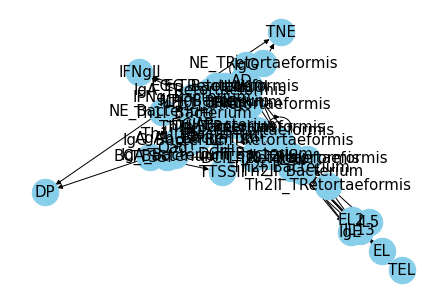

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    MPI_Bacterium,PIC,AD
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
environment:    MPI_Bacterium,PIC,AD,Bb,IFNg_Bacterium,EC_Bacterium,IL10I,AP,EC_TRetortaeformis,IgA_TRetortaeformis,IgG,NE_TRetortaeformis,IS
un:  0.15991955683721687
un_en:  1.6824037190965067
syn:  0.3

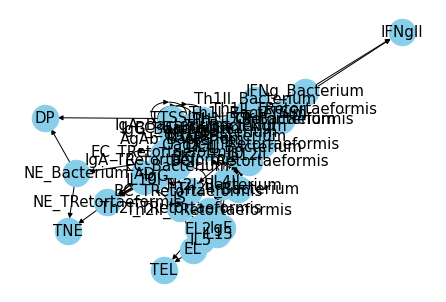

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    MPI_Bacterium,PIC,AP
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]]
environment:    MPI_Bacterium,PIC,AP,Bb,IFNg_Bacterium,EC_Bacterium,AD,IL10I,EC_TRetortaeformis,IgA_TRetortaeformis,Cb,Th1I_Bacterium,IgG_Bacterium,AgAb_Bacterium
un:  0.15124472273860234
un_en:  1.66235

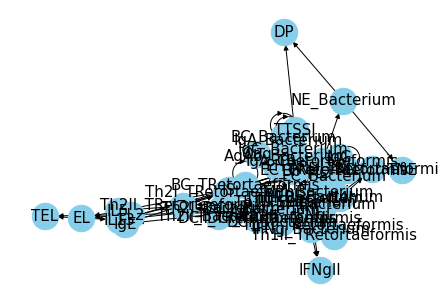

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    MPI_Bacterium,IFNg_Bacterium,IL10I_Bacterium
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]]
environment:    MPI_Bacterium,IFNg_Bacterium,IL10I_Bacterium,Bb,PIC,IL4I,DCI_Bacterium,Th1I_Bacterium,Th2I_Bacterium,TTSSI,TrI_Bacterium
un:  0.4957185892399763
un_en:  1.42098955

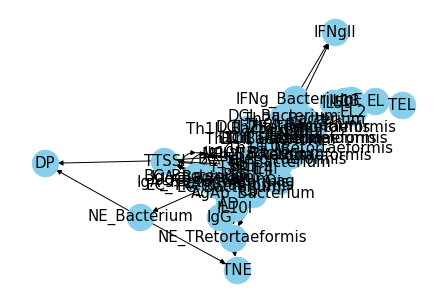

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    Oag,Bb,Cb
tpm: 
[[1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0.

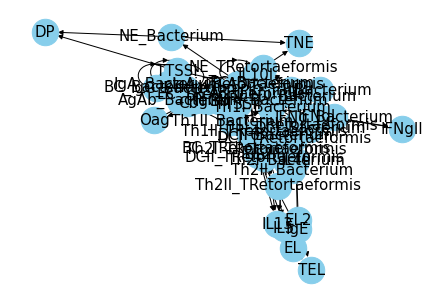

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    Th1II_TRetortaeformis,IL12II,T0
tpm: 
[[1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0

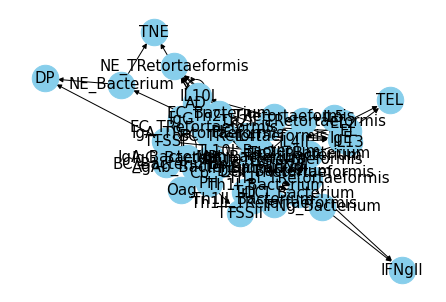

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    Th1II_TRetortaeformis,IL12II,DCII_TRetortaeformis
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]]
environment:    Th1II_TRetortaeformis,IL12II,DCII_TRetortaeformis,T0,DCII_Bacterium,IL4II,DCI_TRetortaeformis
un:  0.33667637174455145
un_en:  1.694548827786958
syn:  0.15505

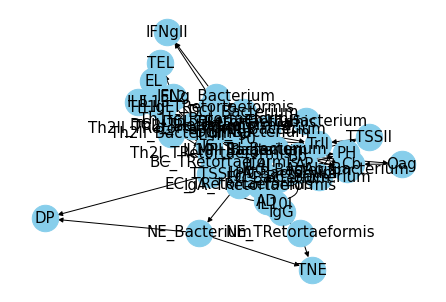

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    Th1II_TRetortaeformis,T0,DCII_TRetortaeformis
tpm: 
[[1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 1.

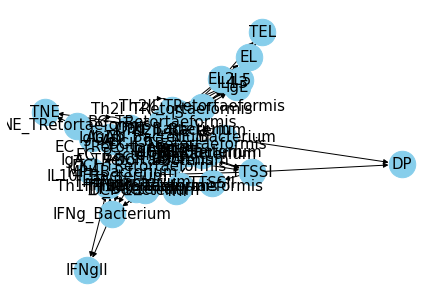

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    Bb,AP,PH
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
environment:    Bb,AP,PH,MPI_Bacterium,Cb,Th1I_Bacterium,IgG_Bacterium,AgAb_Bacterium
un:  1.5960260927379173
un_en:  0.28936156413788633
syn:  0.02326963847382557
---------------------------------------------------

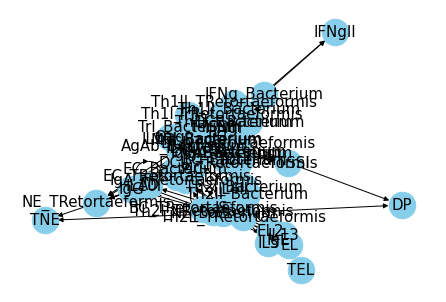

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    Bb,AP,Cb
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
environment:    Bb,AP,Cb,PH,MPI_Bacterium,Th1I_Bacterium,IgG_Bacterium,AgAb_Bacterium,Oag
un:  0.4389959899039573
un_en:  1.359187077084919
syn:  0.3314927307907167
--------------------------------------------------

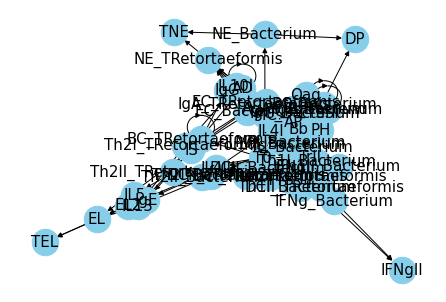

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    Bb,AP,AgAb_Bacterium
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
environment:    Bb,AP,AgAb_Bacterium,PH,MPI_Bacterium,Cb,Th1I_Bacterium,IgG_Bacterium,IgA_Bacterium
un:  0.7736331399211398
un_en:  0.981204951308073
syn:  0.2048443014682082
----------------------------

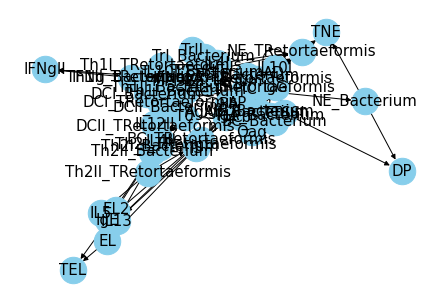

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    Bb,TTSSI,IgA_Bacterium
tpm: 
[[1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0

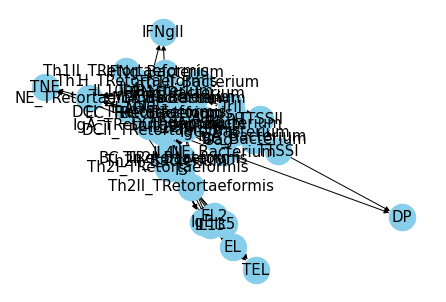

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    Bb,Cb,AgAb_Bacterium
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
environment:    Bb,Cb,AgAb_Bacterium,PH,Oag,IgG_Bacterium,IgA_Bacterium
un:  0.918876833390398
un_en:  1.1963950996790311
syn:  0.39362316660960195
-------------------------------------------------------

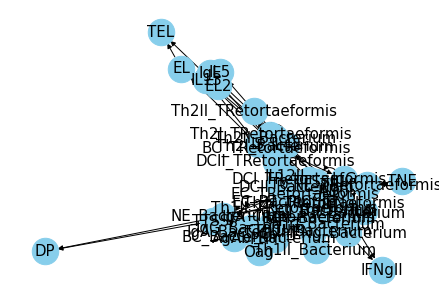

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    Bb,IgA_Bacterium,AgAb_Bacterium
tpm: 
[[1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0

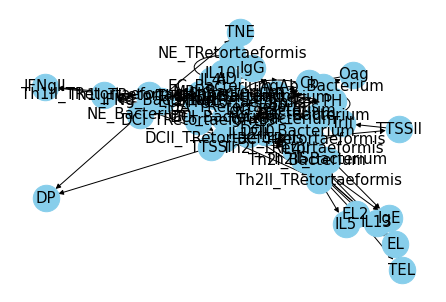

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    PIC,AD,EC_TRetortaeformis
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]]
environment:    PIC,AD,EC_TRetortaeformis,EC_Bacterium,IL10I,AP,IgA_TRetortaeformis,MPI_Bacterium,IgG,NE_TRetortaeformis,IS
un:  0.3139960995437084
un_en:  1.463203648929694
syn:  0.2269813418456395

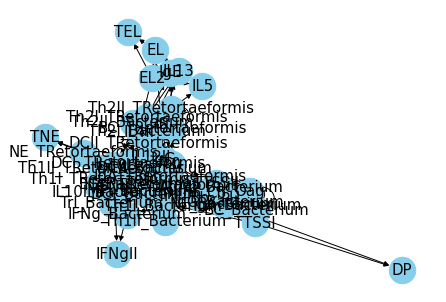

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    PIC,AD,NE_TRetortaeformis
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]]
environment:    PIC,AD,NE_TRetortaeformis,EC_Bacterium,IL10I,AP,EC_TRetortaeformis,IgA_TRetortaeformis,MPI_Bacterium,IgG,IS,IFNgI,IL4I
un:  0.639461511591864
un_en:  1.1991104886300592
syn:  0.31170

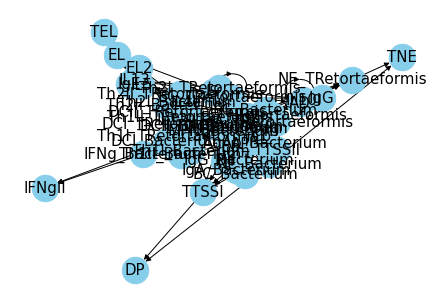

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    PIC,IL10I,NE_TRetortaeformis
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
environment:    PIC,IL10I,NE_TRetortaeformis,EC_Bacterium,AD,AP,EC_TRetortaeformis,IgA_TRetortaeformis,Th2I_TRetortaeformis,IL10I_Bacterium,IFNgI,IL4I
un:  0.5135627984211333
un_en:  1.5184167897

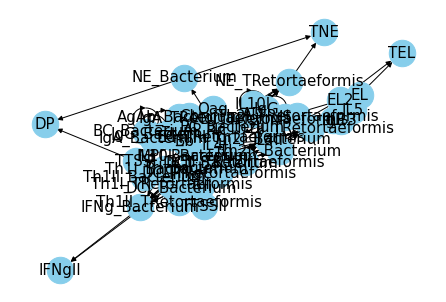

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    IFNgI,IFNg_Bacterium,IFNgII
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]]
environment:    IFNgI,IFNg_Bacterium,IFNgII,Th1I_TRetortaeformis,DCI_TRetortaeformis,MPI_Bacterium,IL4I,DCI_Bacterium,IL10I_Bacterium,Th1I_Bacterium
un:  0.9188212310720749
un_en:  1.0988801624956

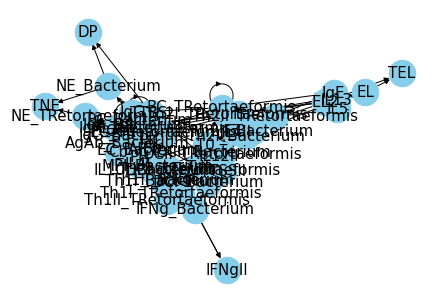

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    DCII_Bacterium,IL12II,IL4II
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]]
environment:    DCII_Bacterium,IL12II,IL4II,DCI_Bacterium,T0,DCII_TRetortaeformis,IFNgI,Th2II_TRetortaeformis,EL2,Th2II_Bacterium
un:  0.27790068560494163
un_en:  1.996138501917569
syn:  0.3895675

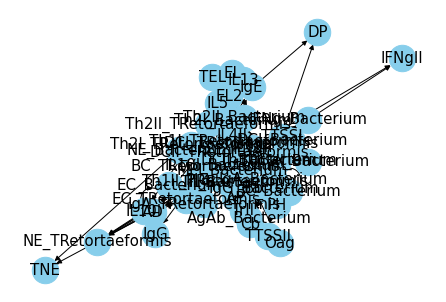

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    DCII_Bacterium,IL12II,T0
tpm: 
[[1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0.]
 [0.

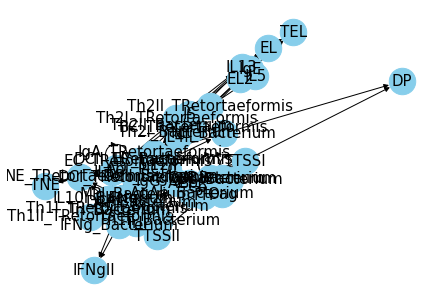

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    DCII_Bacterium,IL12II,Th2II_Bacterium
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
environment:    DCII_Bacterium,IL12II,Th2II_Bacterium,DCI_Bacterium,IL4II,T0,DCII_TRetortaeformis
un:  0.33667637174455145
un_en:  1.694548827786958
syn:  0.15505292492762335
-----------

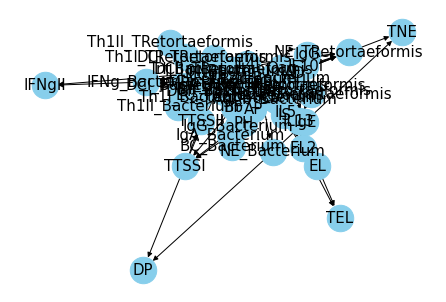

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    DCII_Bacterium,IL12II,Th1II_Bacterium
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]]
environment:    DCII_Bacterium,IL12II,Th1II_Bacterium,DCI_Bacterium,IL4II,T0,DCII_TRetortaeformis
un:  0.33667637174455145
un_en:  1.694548827786958
syn:  0.15505292492762335
-----------

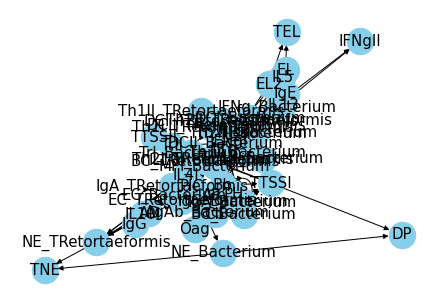

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    DCII_Bacterium,IL4II,T0
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]]
environment:    DCII_Bacterium,IL4II,T0,DCI_Bacterium,IFNgI,IL12II,Th2II_TRetortaeformis,EL2,Th2II_Bacterium,DCII_TRetortaeformis
un:  0.31183312115055056
un_en:  2.2553642493711954
syn:  0.2116043788

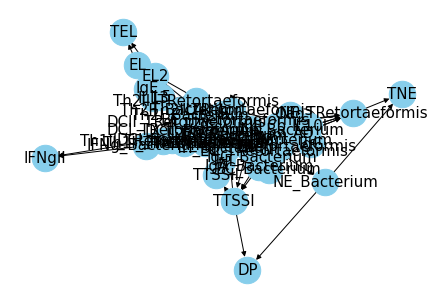

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    DCII_Bacterium,IL4II,Th2II_Bacterium
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 1. 0.]]
environment:    DCII_Bacterium,IL4II,Th2II_Bacterium,DCI_Bacterium,IFNgI,IL12II,Th2II_TRetortaeformis,EL2,T0,DCII_TRetortaeformis
un:  0.14020002446126262
un_en:  2.21265905214156
syn:  0

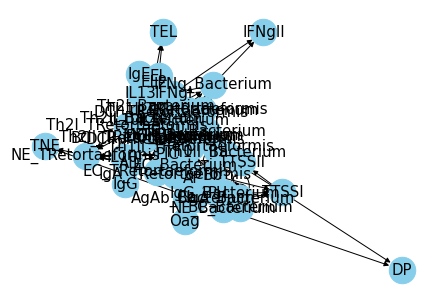

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    DCII_Bacterium,T0,Th2II_Bacterium
tpm: 
[[1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0.

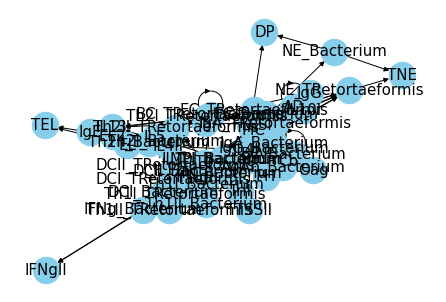

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    DCII_Bacterium,T0,Th1II_Bacterium
tpm: 
[[1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0.

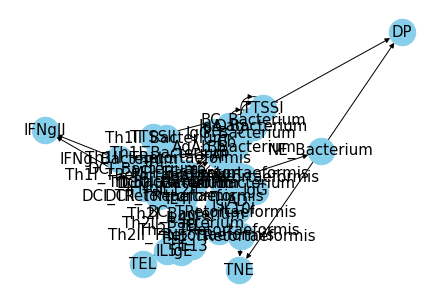

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    DCII_Bacterium,T0,TrII
tpm: 
[[1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0

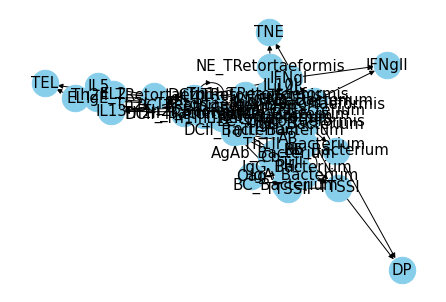

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    IL12II,Th2II_TRetortaeformis,IL4II
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]]
environment:    IL12II,Th2II_TRetortaeformis,IL4II,DCII_Bacterium,T0,DCII_TRetortaeformis,IFNgI,EL2,Th2II_Bacterium
un:  0.4494150830592942
un_en:  1.3464641277337275
syn:  0.34834102041407

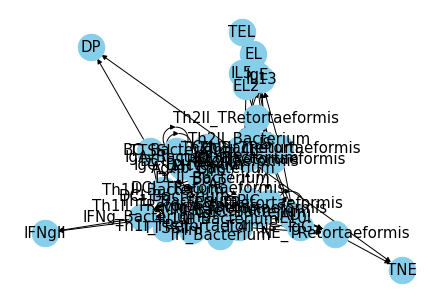

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    IL12II,Th2II_TRetortaeformis,T0
tpm: 
[[1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0

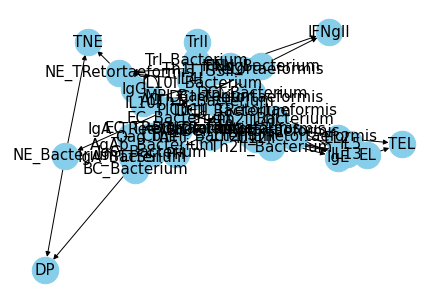

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    IL12II,Th2II_TRetortaeformis,DCII_TRetortaeformis
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]]
environment:    IL12II,Th2II_TRetortaeformis,DCII_TRetortaeformis,DCII_Bacterium,IL4II,T0,DCI_TRetortaeformis
un:  0.33667637174455145
un_en:  1.694548827786958
syn:  0.15505

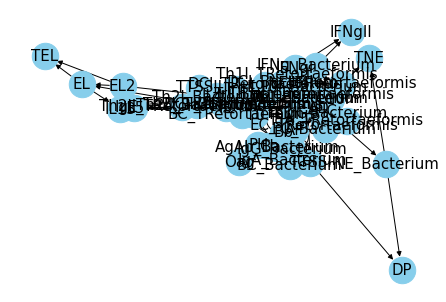

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    IL12II,IL4II,T0
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
environment:    IL12II,IL4II,T0,DCII_Bacterium,DCII_TRetortaeformis,IFNgI,Th2II_TRetortaeformis,EL2,Th2II_Bacterium
un:  0.6436700411667482
un_en:  1.556545067523593
syn:  0.18685965293867735
----------------

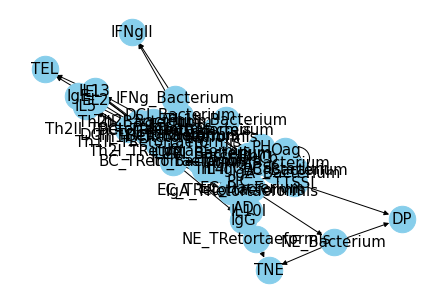

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    IL12II,IL4II,Th2II_Bacterium
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]]
environment:    IL12II,IL4II,Th2II_Bacterium,DCII_Bacterium,T0,DCII_TRetortaeformis,IFNgI,Th2II_TRetortaeformis,EL2
un:  0.4494150830592942
un_en:  1.3464641277337275
syn:  0.3483410204140756
---

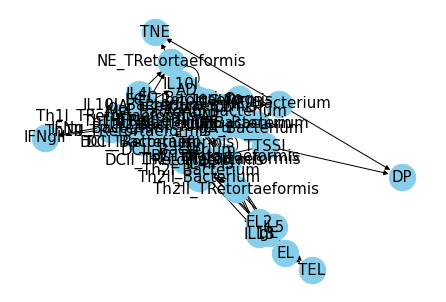

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    IL12II,IL4II,DCII_TRetortaeformis
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
environment:    IL12II,IL4II,DCII_TRetortaeformis,DCII_Bacterium,T0,IFNgI,Th2II_TRetortaeformis,EL2,Th2II_Bacterium,DCI_TRetortaeformis
un:  0.27790068560494163
un_en:  1.996138501917569
syn

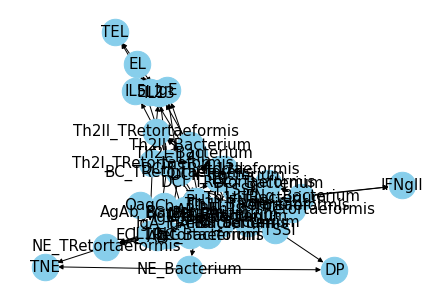

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    IL12II,T0,Th2II_Bacterium
tpm: 
[[1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0

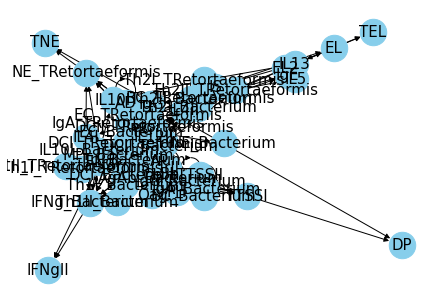

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    IL12II,T0,Th1II_Bacterium
tpm: 
[[1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0

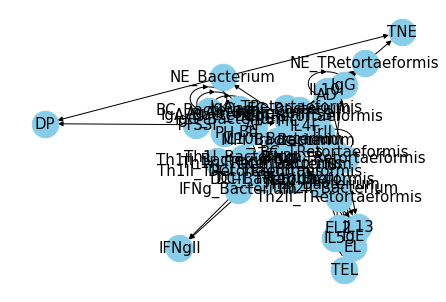

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    IL12II,T0,DCII_TRetortaeformis
tpm: 
[[1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.

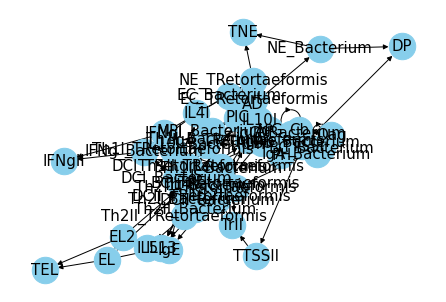

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    Th2II_TRetortaeformis,IL4II,T0
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
environment:    Th2II_TRetortaeformis,IL4II,T0,IL12II,DCII_TRetortaeformis,IFNgI,DCII_Bacterium,EL2,Th2II_Bacterium
un:  0.14541617838065563
un_en:  1.9629428285492712
syn:  0.14851004231401832

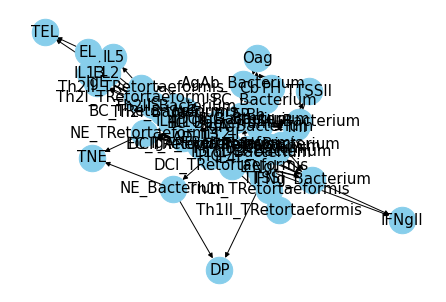

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    Th2II_TRetortaeformis,IL4II,DCII_TRetortaeformis
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
environment:    Th2II_TRetortaeformis,IL4II,DCII_TRetortaeformis,IL12II,T0,IFNgI,DCII_Bacterium,EL2,Th2II_Bacterium,DCI_TRetortaeformis
un:  0.14020002446126262
un_en:  2.2126

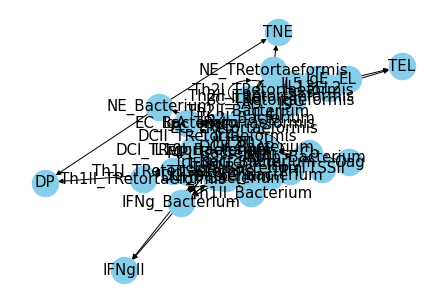

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    Th2II_TRetortaeformis,T0,DCII_TRetortaeformis
tpm: 
[[1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 1.

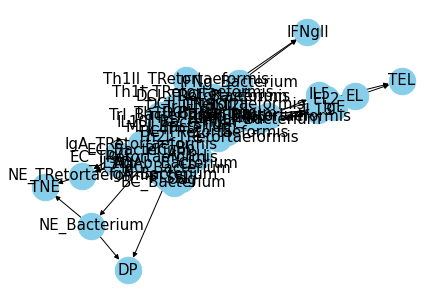

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    AP,Cb,IgG_Bacterium
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]]
environment:    AP,Cb,IgG_Bacterium,MPI_Bacterium,Bb,Th1I_Bacterium,AgAb_Bacterium,Oag,BC_Bacterium
un:  0.39059497146173494
un_en:  1.4139884478030584
syn:  0.33788246992761306
--------------------------

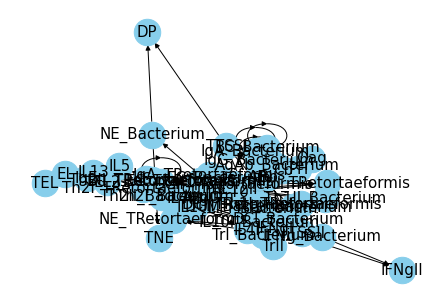

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    AP,Cb,AgAb_Bacterium
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]]
environment:    AP,Cb,AgAb_Bacterium,MPI_Bacterium,Bb,Th1I_Bacterium,IgG_Bacterium,Oag,IgA_Bacterium
un:  0.16956545010207566
un_en:  1.7165156381577664
syn:  0.3089119912872722
-------------------------

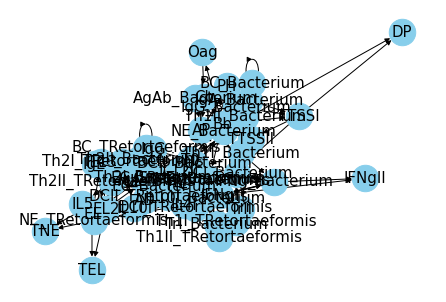

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    AP,IgG_Bacterium,AgAb_Bacterium
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]]
environment:    AP,IgG_Bacterium,AgAb_Bacterium,MPI_Bacterium,Bb,Cb,Th1I_Bacterium,BC_Bacterium,IgA_Bacterium
un:  0.3921422302211919
un_en:  1.3718184349240525
syn:  0.3314714904734821
------

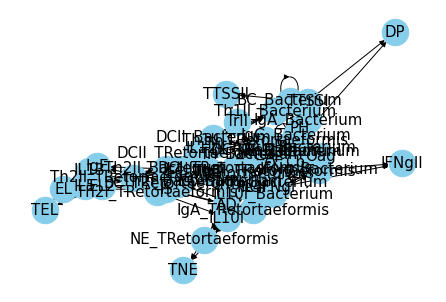

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    IL4II,EL2,IgE
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 0. 1.]]
environment:    IL4II,EL2,IgE,IFNgI,DCII_Bacterium,IL12II,Th2II_TRetortaeformis,T0,Th2II_Bacterium,DCII_TRetortaeformis,IL5,IL13,BC_TRetortaeformis
un:  0.7088656166133305
un_en:  1.5842763737185241
syn:  0.580

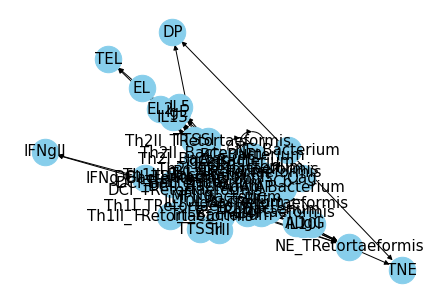

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    IL4II,T0,Th2II_Bacterium
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 1. 0.]]
environment:    IL4II,T0,Th2II_Bacterium,IFNgI,DCII_Bacterium,IL12II,Th2II_TRetortaeformis,EL2,DCII_TRetortaeformis
un:  0.1454161783806556
un_en:  1.9629428285492714
syn:  0.14851004231401835
------

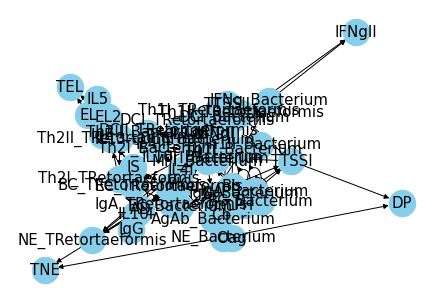

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    IL4II,T0,DCII_TRetortaeformis
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 0. 1.]]
environment:    IL4II,T0,DCII_TRetortaeformis,IFNgI,DCII_Bacterium,IL12II,Th2II_TRetortaeformis,EL2,Th2II_Bacterium,DCI_TRetortaeformis
un:  0.31183312115055056
un_en:  2.255364249371195
syn:  0

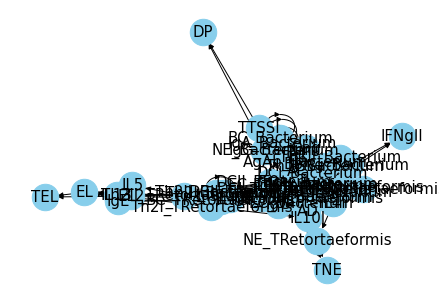

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    EL2,IgE,IL13
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]]
environment:    EL2,IgE,IL13,IL5,IL4II,BC_TRetortaeformis,Th2I_Bacterium,Th2I_TRetortaeformis,EL,IS
un:  0.35079661770971915
un_en:  1.5503125133296833
syn:  0.45343267896245687
---------------------------------

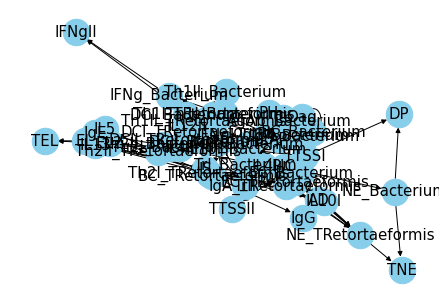

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    EL2,EL,IL13
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]]
environment:    EL2,EL,IL13,IL5,IgE,IS,Th2I_Bacterium,Th2I_TRetortaeformis
un:  0.5020975170099808
un_en:  1.2744658759117222
syn:  0.43540248299001916
------------------------------------------------------------

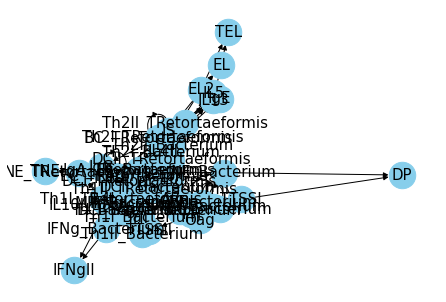

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    EL2,EL,TEL
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]]
environment:    EL2,EL,TEL,IL5,IgE,IL13,IS
un:  1.0487949406953985
un_en:  1.3475898813907972
syn:  0.10684412153416778
---------------------------------------------------------------------------------------------

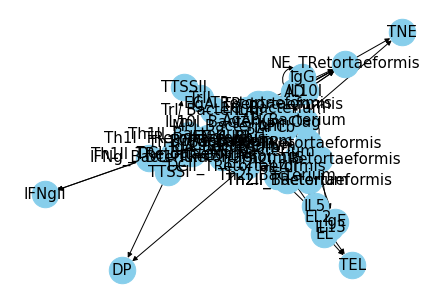

all intrinsic variables: MPI_Bacterium,Th2I_Bacterium,Oag,Th1II_TRetortaeformis,Bb,PIC,IFNgI,Th2I_TRetortaeformis,DCII_Bacterium,IL12II,EC_Bacterium,AD,IL5,IL10I,IgG,Th1I_TRetortaeformis,NE_Bacterium,IL4I,Th2II_TRetortaeformis,DP,AP,TTSSI,DCI_Bacterium,IL4II,EL2,IgE,TTSSII,TNE,IFNg_Bacterium,BC_Bacterium,EL,IL10I_Bacterium,T0,Th2II_Bacterium,IFNgII,EC_TRetortaeformis,Th1II_Bacterium,PH,DCI_TRetortaeformis,Cb,IgA_Bacterium,BC_TRetortaeformis,Th1I_Bacterium,TrI_Bacterium,IL13,IgG_Bacterium,DCII_TRetortaeformis,AgAb_Bacterium,NE_TRetortaeformis,TEL,TrII,IgA_TRetortaeformis
external parameters:IS
mechanism:    Cb,IgG_Bacterium,AgAb_Bacterium
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]]
environment:    Cb,IgG_Bacterium,AgAb_Bacterium,Oag,Bb,BC_Bacterium,IgA_Bacterium
un:  0.7207594697016403
un_en:  1.5228825261558607
syn:  0.3765149441918386
----------------------------------

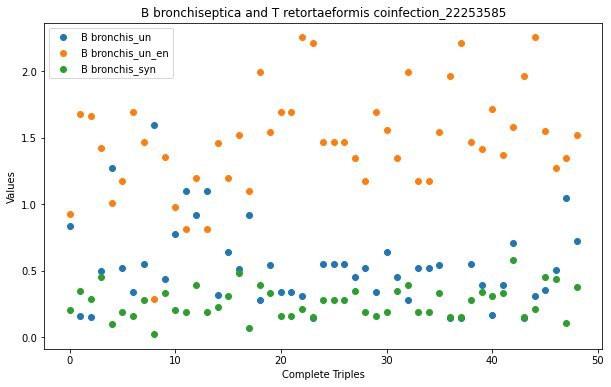

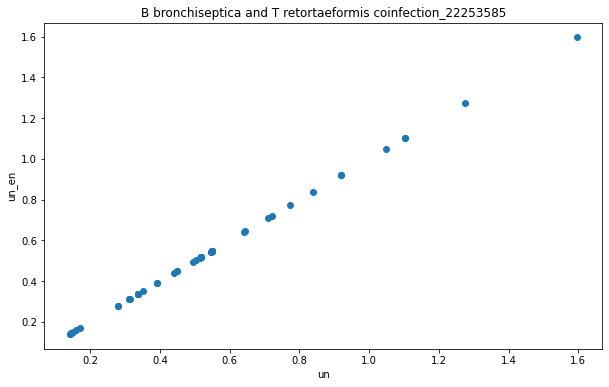

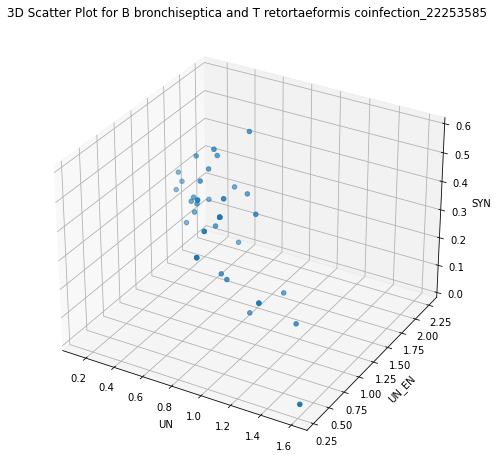

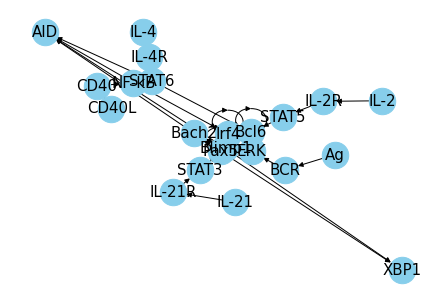

all intrinsic variables: XBP1,Blimp1,Bach2,IL-21R,STAT3,CD40,Bcl6,STAT5,Irf4,AID,IL-2R,IL-4R,Pax5,NF-kB,STAT6,ERK,BCR
external parameters:Ag,IL-4,IL-2,IL-21,CD40L
mechanism:    XBP1,Blimp1,Pax5
tpm: 
[[0. 1. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]
environment:    XBP1,Blimp1,Pax5,Bach2,STAT3,Bcl6,Irf4,ERK
un:  1.0604546688546534
un_en:  0.6002269449679228
syn:  0.22814962781752168
------------------------------------------------------------------------------------------------------------------------


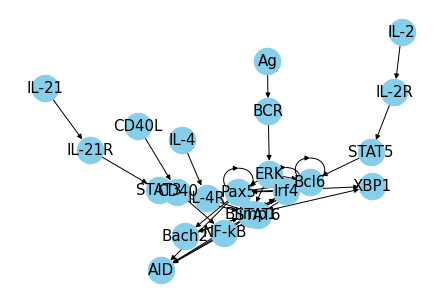

all intrinsic variables: XBP1,Blimp1,Bach2,IL-21R,STAT3,CD40,Bcl6,STAT5,Irf4,AID,IL-2R,IL-4R,Pax5,NF-kB,STAT6,ERK,BCR
external parameters:Ag,IL-4,IL-2,IL-21,CD40L
mechanism:    Blimp1,Bach2,Pax5
tpm: 
[[0. 1. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]
environment:    Blimp1,Bach2,Pax5,STAT3,Bcl6,Irf4,ERK
un:  1.1254390188236467
un_en:  0.5382416793023173
syn:  0.15726771923787575
------------------------------------------------------------------------------------------------------------------------


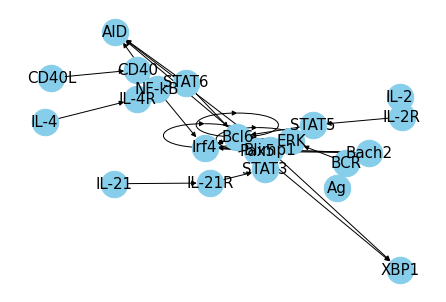

all intrinsic variables: XBP1,Blimp1,Bach2,IL-21R,STAT3,CD40,Bcl6,STAT5,Irf4,AID,IL-2R,IL-4R,Pax5,NF-kB,STAT6,ERK,BCR
external parameters:Ag,IL-4,IL-2,IL-21,CD40L
mechanism:    Blimp1,Bcl6,Irf4
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]]
environment:    Blimp1,Bcl6,Irf4,Bach2,STAT3,Pax5,ERK,STAT5,STAT6,NF-kB
un:  0.5883335734200552
un_en:  0.8928665776112976
syn:  0.350443935462436
------------------------------------------------------------------------------------------------------------------------


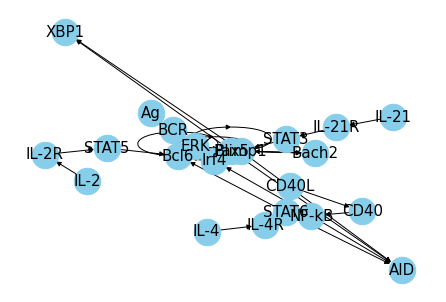

all intrinsic variables: XBP1,Blimp1,Bach2,IL-21R,STAT3,CD40,Bcl6,STAT5,Irf4,AID,IL-2R,IL-4R,Pax5,NF-kB,STAT6,ERK,BCR
external parameters:Ag,IL-4,IL-2,IL-21,CD40L
mechanism:    Blimp1,Bcl6,Pax5
tpm: 
[[0. 1. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]
environment:    Blimp1,Bcl6,Pax5,Bach2,STAT3,Irf4,ERK,STAT5,STAT6
un:  0.5018188108974
un_en:  0.5533560672535549
syn:  0.31501033924814514
------------------------------------------------------------------------------------------------------------------------


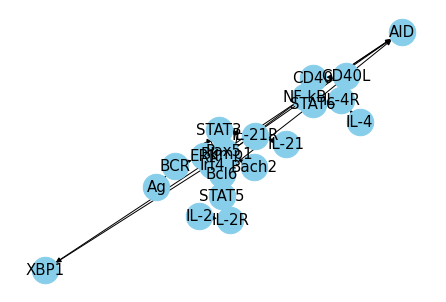

all intrinsic variables: XBP1,Blimp1,Bach2,IL-21R,STAT3,CD40,Bcl6,STAT5,Irf4,AID,IL-2R,IL-4R,Pax5,NF-kB,STAT6,ERK,BCR
external parameters:Ag,IL-4,IL-2,IL-21,CD40L
mechanism:    Blimp1,Bcl6,ERK
tpm: 
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]]
environment:    Blimp1,Bcl6,ERK,Bach2,STAT3,Irf4,Pax5,STAT5,STAT6,BCR
un:  0.35104174756685236
un_en:  1.3986901276577828
syn:  0.2196203854159503
------------------------------------------------------------------------------------------------------------------------


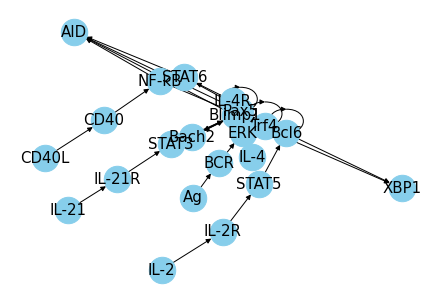

all intrinsic variables: XBP1,Blimp1,Bach2,IL-21R,STAT3,CD40,Bcl6,STAT5,Irf4,AID,IL-2R,IL-4R,Pax5,NF-kB,STAT6,ERK,BCR
external parameters:Ag,IL-4,IL-2,IL-21,CD40L
mechanism:    Blimp1,Irf4,Pax5
tpm: 
[[0. 1. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]]
environment:    Blimp1,Irf4,Pax5,Bach2,STAT3,Bcl6,ERK,NF-kB
un:  0.48356765024668324
un_en:  1.2088405183846884
syn:  0.35753352849159226
------------------------------------------------------------------------------------------------------------------------


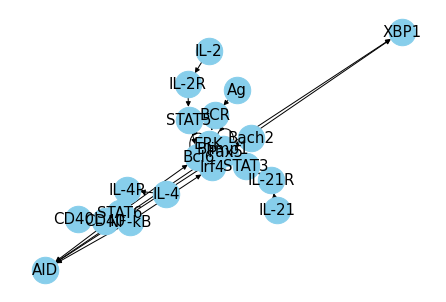

all intrinsic variables: XBP1,Blimp1,Bach2,IL-21R,STAT3,CD40,Bcl6,STAT5,Irf4,AID,IL-2R,IL-4R,Pax5,NF-kB,STAT6,ERK,BCR
external parameters:Ag,IL-4,IL-2,IL-21,CD40L
mechanism:    Blimp1,AID,Pax5
tpm: 
[[0. 1. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]
environment:    Blimp1,AID,Pax5,Bach2,STAT3,Bcl6,Irf4,ERK,NF-kB,STAT6
un:  0.708222897712279
un_en:  0.8880856032764191
syn:  0.39311050062380903
------------------------------------------------------------------------------------------------------------------------


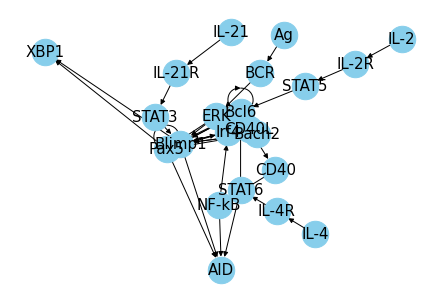

all intrinsic variables: XBP1,Blimp1,Bach2,IL-21R,STAT3,CD40,Bcl6,STAT5,Irf4,AID,IL-2R,IL-4R,Pax5,NF-kB,STAT6,ERK,BCR
external parameters:Ag,IL-4,IL-2,IL-21,CD40L
mechanism:    Blimp1,Pax5,ERK
tpm: 
[[0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]]
environment:    Blimp1,Pax5,ERK,Bach2,STAT3,Bcl6,Irf4,BCR
un:  0.6851875760219432
un_en:  1.293985571701625
syn:  0.20553815240747153
------------------------------------------------------------------------------------------------------------------------


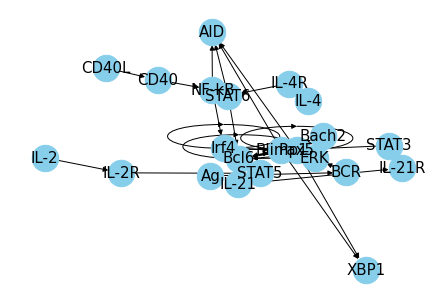

all intrinsic variables: XBP1,Blimp1,Bach2,IL-21R,STAT3,CD40,Bcl6,STAT5,Irf4,AID,IL-2R,IL-4R,Pax5,NF-kB,STAT6,ERK,BCR
external parameters:Ag,IL-4,IL-2,IL-21,CD40L
mechanism:    Bcl6,Irf4,Pax5
tpm: 
[[0. 1. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]]
environment:    Bcl6,Irf4,Pax5,Blimp1,STAT5,STAT6,ERK,NF-kB
un:  0.39720327721840326
un_en:  0.9834762913357402
syn:  0.3854188302357195
------------------------------------------------------------------------------------------------------------------------


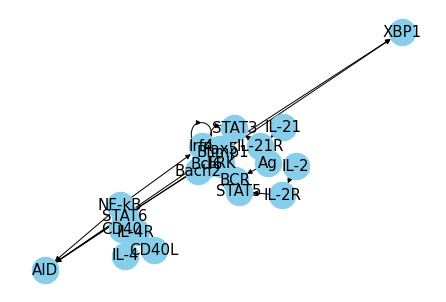

all intrinsic variables: XBP1,Blimp1,Bach2,IL-21R,STAT3,CD40,Bcl6,STAT5,Irf4,AID,IL-2R,IL-4R,Pax5,NF-kB,STAT6,ERK,BCR
external parameters:Ag,IL-4,IL-2,IL-21,CD40L
mechanism:    Bcl6,Pax5,ERK
tpm: 
[[0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 1. 0.]
 ...
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]]
environment:    Bcl6,Pax5,ERK,Blimp1,STAT5,Irf4,STAT6,BCR
un:  0.2570953763337259
un_en:  1.4045999429058842
syn:  0.2210765961704051
------------------------------------------------------------------------------------------------------------------------


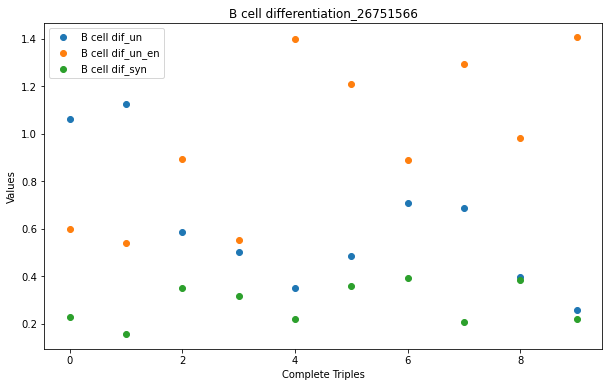

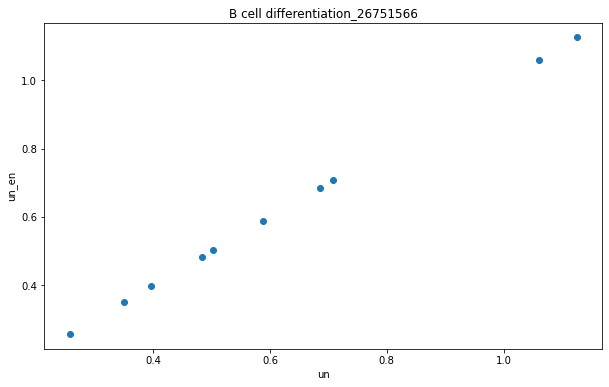

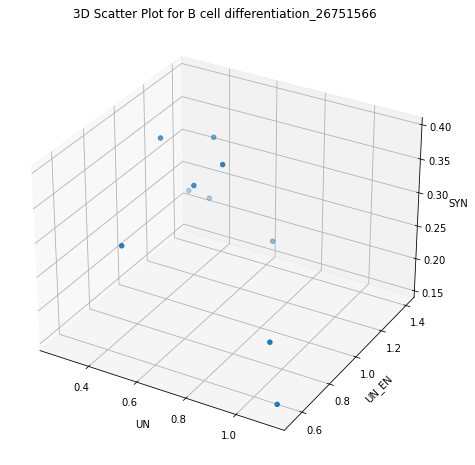

In [26]:
for file_name in list(file_dict.values())[0:5]:
    cal_motify(file_name)